# TFG // EXPLORATORY DATA ANALYSIS (ordenado)
@ 4/21/2025


1. Perform EDA 
2. tslearn library: time series analysis

In [1]:
%pip install tslearn geopandas

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


## Libraries

In [1]:
# geopandas
import geopandas as gpd
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from tslearn.clustering import TimeSeriesKMeans
from statsmodels.tsa.seasonal import seasonal_decompose

# functions
from utils.preprocess import *
from statsmodels.tsa.seasonal import seasonal_decompose

In [2]:
df = pd.read_csv('data/final_unified_dataset.csv')
df

,region,datetime,consumption,thermal,wind,solar,hydraulic,bioenergies,temperature_2m,relative_humidity_2m,...,surface_pressure,cloud_cover,wind_speed_10m,wind_direction_10m,wind_gusts_10m,is_day,sunshine_duration,direct_radiation,diffuse_radiation,global_tilted_irradiance
0,Auvergne-Rhône-Alpes,2018-01-01 00:00:00,8304.0,206.5,280.0,0.0,3846.0,140.5,5.35,87.5,...,946.95,92.2,10.75,233.9,29.61,0.0,0.0,0.0,0.0,0.0
1,Auvergne-Rhône-Alpes,2018-01-01 01:00:00,7944.0,197.0,264.0,0.0,3943.5,140.5,5.01,86.8,...,947.39,87.7,9.42,235.1,31.83,0.0,0.0,0.0,0.0,0.0
2,Auvergne-Rhône-Alpes,2018-01-01 02:00:00,7939.0,197.0,267.0,0.0,3527.0,138.5,4.33,87.5,...,947.99,86.4,8.92,206.6,29.55,0.0,0.0,0.0,0.0,0.0
3,Auvergne-Rhône-Alpes,2018-01-01 03:00:00,7760.0,197.0,257.5,0.0,3266.0,137.0,4.23,85.6,...,948.46,86.7,8.79,244.1,26.03,0.0,0.0,0.0,0.0,0.0
4,Auvergne-Rhône-Alpes,2018-01-01 04:00:00,7534.0,197.0,232.0,0.0,3018.5,139.5,4.17,85.5,...,948.50,78.7,9.70,247.2,26.39,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
525883,PACA,2022-12-31 19:00:00,4950.0,186.5,70.5,0.0,978.0,188.0,9.23,89.3,...,962.34,57.2,11.07,144.7,26.89,0.0,0.0,0.0,0.0,0.0
525884,PACA,2022-12-31 20:00:00,4694.0,186.0,70.5,0.0,948.5,189.5,8.93,90.2,...,962.45,58.8,11.07,114.3,27.62,0.0,0.0,0.0,0.0,0.0
525885,PACA,2022-12-31 21:00:00,4416.5,186.0,72.5,0.0,946.5,188.5,8.83,91.2,...,962.59,80.6,10.62,115.2,27.94,0.0,0.0,0.0,0.0,0.0
525886,PACA,2022-12-31 22:00:00,4367.5,188.5,72.5,0.0,967.5,191.0,8.73,91.2,...,962.78,72.3,9.52,117.2,26.76,0.0,0.0,0.0,0.0,0.0


In [3]:
df_both = preprocess_both(df)
df_both.head(3)

,region,wind,solar,temperature_2m,relative_humidity_2m,apparent_temperature,precipitation,surface_pressure,cloud_cover,wind_speed_10m,...,direct_radiation,diffuse_radiation,solar_power_t-24,solar_power_t-168,wind_power_t-24,wind_power_t-168,hour,month,year,total_radiation
datetime,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,Auvergne-Rhône-Alpes,280.0,0.0,5.35,87.5,2.25,0.43,946.95,92.2,10.75,...,0.0,0.0,0.0,0.0,0.0,0.0,0,1,2018,0.0
2018-01-01 01:00:00,Auvergne-Rhône-Alpes,264.0,0.0,5.01,86.8,2.03,0.51,947.39,87.7,9.42,...,0.0,0.0,0.0,0.0,0.0,0.0,1,1,2018,0.0
2018-01-01 02:00:00,Auvergne-Rhône-Alpes,267.0,0.0,4.33,87.5,1.34,0.37,947.99,86.4,8.92,...,0.0,0.0,0.0,0.0,0.0,0.0,2,1,2018,0.0


In [4]:
lag_features = [col for col in df_both.columns if 'solar_power_' in col or 'wind_power_' in col]
time_features = ['year', 'month', 'hour', 'hour_sin', 'hour_cos', 'month_sin', 'month_cos']
energy_features = ['solar', 'wind']
weather_features = [col for col in df_both.columns if col not in lag_features + time_features + energy_features + ['region', 'region_code']]
weather_features

['temperature_2m',
 'relative_humidity_2m',
 'apparent_temperature',
 'precipitation',
 'surface_pressure',
 'cloud_cover',
 'wind_speed_10m',
 'wind_direction_10m',
 'wind_gusts_10m',
 'is_day',
 'sunshine_duration',
 'direct_radiation',
 'diffuse_radiation',
 'total_radiation']

Geopandas maps.

In [5]:
# create a name mapping for our regions and those in geojson_data

# Create a name mapping dictionary
name_mapping = {
    "Auvergne-Rhône-Alpes": "Auvergne-Rhône-Alpes",
    "Bourgogne-Franche-Comté": "Bourgogne-Franche-Comté",
    "Bretagne": "Bretagne",
    "Centre-Val-de-Loire": "Centre-Val de Loire",
    "Corse": "Corse",
    "Grand-Est": "Grand Est",
    "Hauts-de-France": "Hauts-de-France",
    "Ile-de-France": "Île-de-France",
    "Normandie": "Normandie",
    "Nouvelle-Aquitaine": "Nouvelle-Aquitaine",
    "Occitanie": "Occitanie",
    "Pays-de-la-Loire": "Pays de la Loire",
    "PACA": "Provence-Alpes-Côte d'Azur",
    "Guadeloupe": "Guadeloupe",
    "Martinique": "Martinique",
    "Guyane": "Guyane",
    "La Réunion": "La Réunion",
    "Mayotte": "Mayotte"
}

df_chloropleth = df.copy()
df_chloropleth['Region'] = df_chloropleth["region"].replace(name_mapping)
df_chloropleth = df_chloropleth[['Region', 'solar', 'wind']]
regional_energy = df_chloropleth.groupby('Region')[['solar', 'wind']].mean().reset_index()
regional_energy

,Region,solar,wind
0,Auvergne-Rhône-Alpes,163.638303,141.669177
1,Bourgogne-Franche-Comté,48.768278,204.492128
2,Bretagne,32.009960,227.520149
3,Centre-Val de Loire,58.856072,307.761318
4,Grand Est,107.047223,881.875171
5,Hauts-de-France,27.987267,1115.817235
6,Normandie,23.196548,204.742801
7,Nouvelle-Aquitaine,417.779767,268.484358
8,Occitanie,326.325278,393.666621
9,Pays de la Loire,81.674094,254.243964


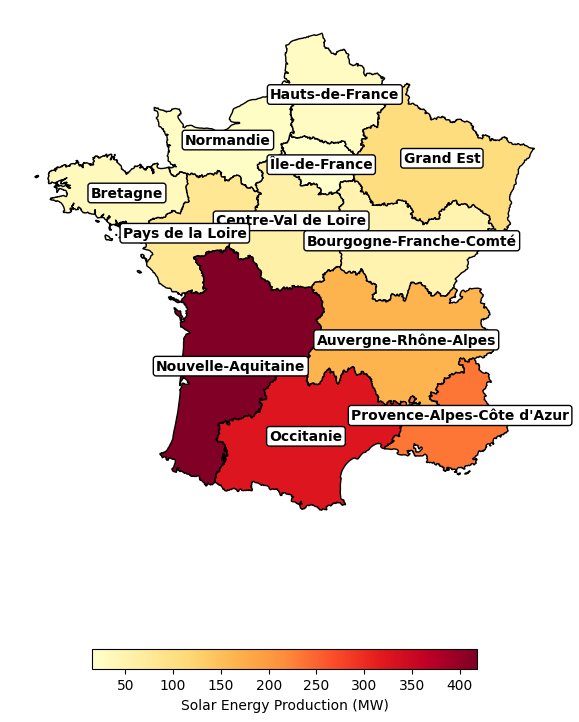

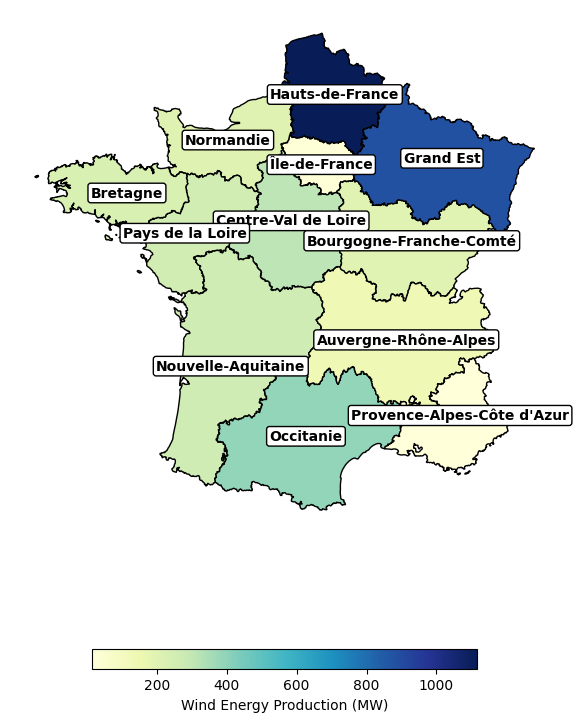

In [27]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib import font_manager

geojson_url = "data/france_regions.geojson"
gdf = gpd.read_file(geojson_url)
gdf = gdf.merge(regional_energy, how='left', left_on='nom', right_on='Region')

# Only keep matched regions
gdf_filtered = gdf[gdf['Region'].notna()].copy()

columns = ['solar', 'wind']
for energy in columns:
    fig, ax = plt.subplots(figsize=(6, 8))

    cmap = 'YlOrRd' if energy == 'solar' else 'YlGnBu'
    gdf_filtered.plot(column=energy, ax=ax, legend=True, cmap=cmap, edgecolor='black',
                      linewidth=1,
                      legend_kwds={'label': f"{energy.capitalize()} Energy Production (MW)",
                                   'orientation': "horizontal", 'shrink':0.7})

    for idx, row in gdf_filtered.iterrows():
        # Use representative_point instead of centroid for better label placement
        point = row['geometry'].representative_point()
        ax.text(point.x, point.y, row['nom'],
                fontsize=10, color='black', ha='center', va='center', fontweight='bold',
                fontname='DejaVu Sans',
                bbox=dict(boxstyle='round,pad=0.2', fc='white', ec='black'))

    ax.set_axis_off()
    plt.tight_layout()
    plt.show()
    fig.savefig(f'figures/{energy}_chloropleth_map.pdf', transparent=True)


In [6]:
df_both.columns

Index(['region', 'wind', 'solar', 'temperature_2m', 'relative_humidity_2m',
       'apparent_temperature', 'precipitation', 'surface_pressure',
       'cloud_cover', 'wind_speed_10m', 'wind_direction_10m', 'wind_gusts_10m',
       'is_day', 'sunshine_duration', 'direct_radiation', 'diffuse_radiation',
       'solar_power_t-24', 'solar_power_t-168', 'wind_power_t-24',
       'wind_power_t-168', 'hour', 'month', 'year'],
      dtype='object')

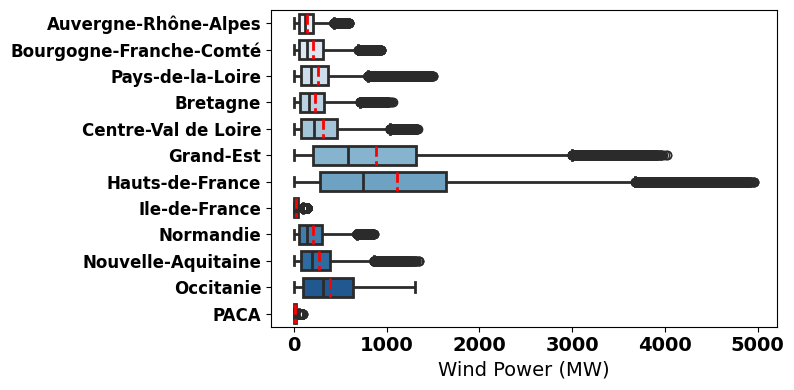

In [52]:
plt.figure(figsize=(8, 4))

sns.boxplot(data=df_both, y='region', x='wind', linewidth=2, gap=.1,
            palette='Blues', hue='region',
            meanline=True, showmeans=True, 
            meanprops={'color':'r', 'linewidth':2})
plt.xlabel('Wind Power (MW)', fontsize=14)
plt.ylabel('', fontsize=14)
plt.xticks(size=14, fontweight='bold')
plt.yticks(size=12, fontweight='bold')
plt.tight_layout()
#plt.savefig('figures/wind_speed_boxplot.png', dpi=400)
plt.show()

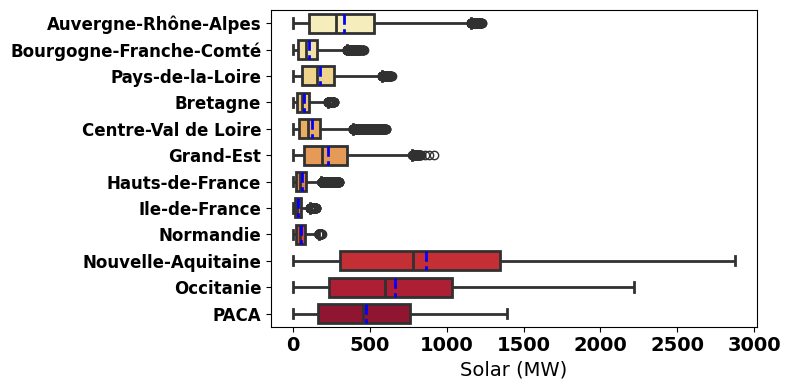

In [49]:
plt.figure(figsize=(8, 4))
filter_ = df_both[df_both['is_day']==1]
sns.boxplot(data=filter_, y='region', x='solar', linewidth=2,gap=.1,
            palette='YlOrRd', hue='region', 
            meanprops={'color':'b', 'linewidth':2}, showmeans=True, meanline=True)
plt.xlabel('Solar (MW)', fontsize=14)
plt.ylabel('', fontsize=14)
plt.xticks(size=14, fontweight='bold')
plt.yticks(size=12, fontweight='bold')
plt.tight_layout()
#plt.savefig('figures/radiation_boxplot.png', dpi=400)
plt.show()

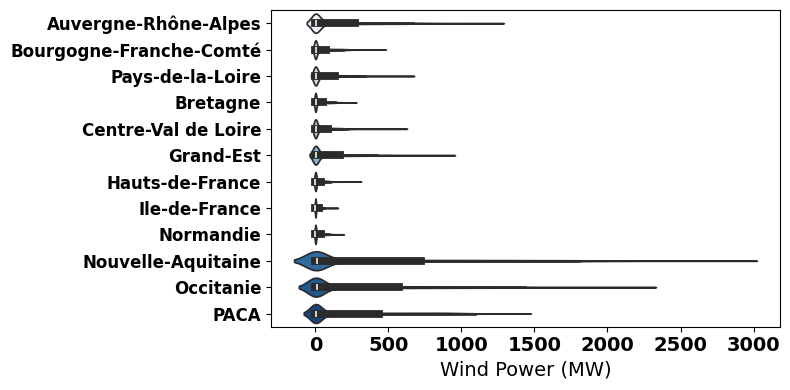

In [55]:
plt.figure(figsize=(8, 4))

sns.violinplot(data=df_both, y='region', x='solar', gap=.1,
            palette='Blues', hue='region')
plt.xlabel('Wind Power (MW)', fontsize=14)
plt.ylabel('', fontsize=14)
plt.xticks(size=14, fontweight='bold')
plt.yticks(size=12, fontweight='bold')
plt.tight_layout()
#plt.savefig('figures/wind_speed_boxplot.png', dpi=400)
plt.show()

In [17]:
df_both['solar_is_zero'] = (df_both['solar'] == 0).astype(int)
df_both['solar_is_zero'].value_counts()

solar_is_zero
0    282972
1    242916
Name: count, dtype: int64

C:\Users\melan\AppData\Local\Temp\ipykernel_8028\2362914626.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['Non Zero', 'Zero'])


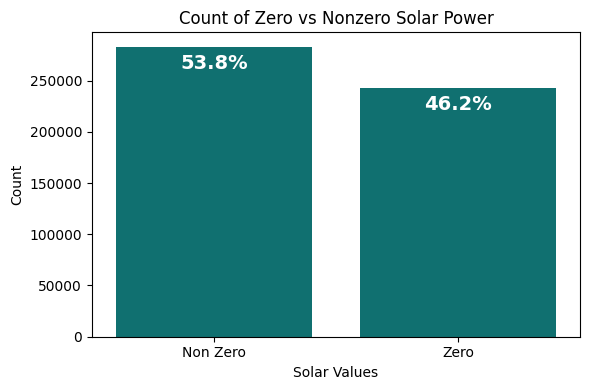

In [82]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df_both is your DataFrame and it's already loaded

plt.figure(figsize=(6, 4))
ax = sns.countplot(data=df_both, x='solar_is_zero', color='teal') # Get the axes object from the plot

# Set labels and title using the axes object
ax.set_xlabel('Solar Values')
ax.set_ylabel('Count')
ax.set_title('Count of Zero vs Nonzero Solar Power')

# Set the xtick labels using the axes object
ax.set_xticklabels(['Non Zero', 'Zero'])

# Calculate total count for percentage calculation
total = len(df_both['solar_is_zero'])

# Add percentages on top of the bars
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height/total:.1%}', # Format as percentage with one decimal place
                (p.get_x() + p.get_width() / 2., height), # Position the text above the bar
                ha='center', # Center the text horizontally
                va='center', # Center the text vertically
                xytext=(0, -12), # Offset the text slightly above the bar
                textcoords='offset points', fontsize='14', fontweight='bold', color='white')

plt.tight_layout()
plt.show()


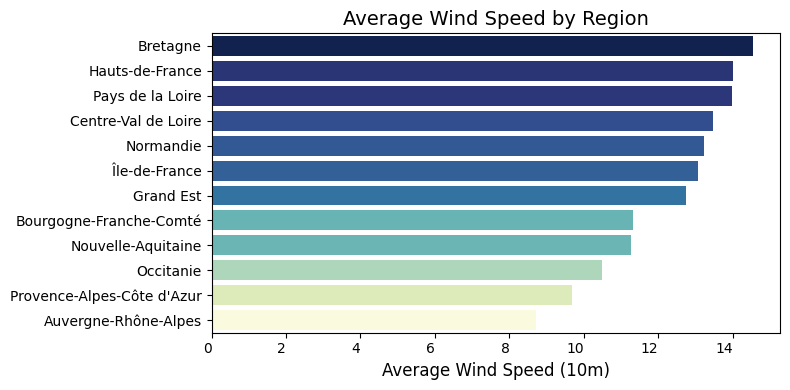

In [ ]:
plt.figure(figsize=(8, 4))

sorted_regions = regional_energy.sort_values(by='wind_speed_10m', ascending=False)['Region']

sns.barplot(data=regional_energy, x='wind_speed_10m', y='Region', 
            palette='YlGnBu', hue='wind_speed_10m', 
            order=sorted_regions, width=0.8)
plt.title('Average Wind Speed by Region', fontsize=14)
plt.xlabel('Average Wind Speed (10m)', fontsize=12)
plt.ylabel('')
plt.xticks(ha='right') 
plt.tight_layout()
plt.legend().remove()
plt.savefig("figures/avg_wind_speed.png", dpi=300)
plt.show()


In [49]:
df_both['total_radiation'] = df_both['diffuse_radiation'] + df_both['direct_radiation']

radiation_avg = df_both.groupby('region')['total_radiation'].mean().reset_index()
radiation_avg

,region,total_radiation
0,Auvergne-Rhône-Alpes,162.407202
1,Bourgogne-Franche-Comté,152.518793
2,Bretagne,143.749427
3,Centre-Val de Loire,149.334381
4,Grand-Est,145.595998
5,Hauts-de-France,139.617360
6,Ile-de-France,144.593878
7,Normandie,141.075968
8,Nouvelle-Aquitaine,155.397955
9,Occitanie,163.774096


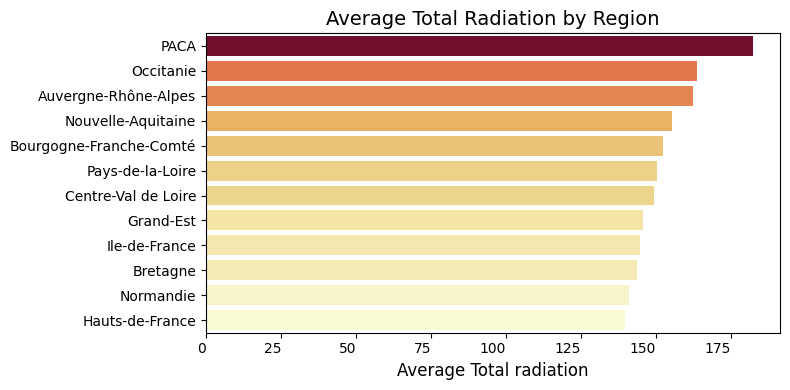

In [ ]:
plt.figure(figsize=(6, 4))

sorted_regions = radiation_avg.sort_values(by='total_radiation', ascending=False)['region']

sns.barplot(data=radiation_avg, x='total_radiation', y='region', 
            palette='YlOrRd', hue='total_radiation', 
            order=sorted_regions, width=0.8)
plt.title('Average Total Radiation by Region', fontsize=14)
plt.xlabel('Average Total radiation', fontsize=14, fontweight='bold')
plt.ylabel('')
plt.xticks(ha='right') 
plt.tight_layout()
plt.legend().remove()
#plt.savefig("figures/avg_solar_radiation.png", dpi=300)
plt.show()


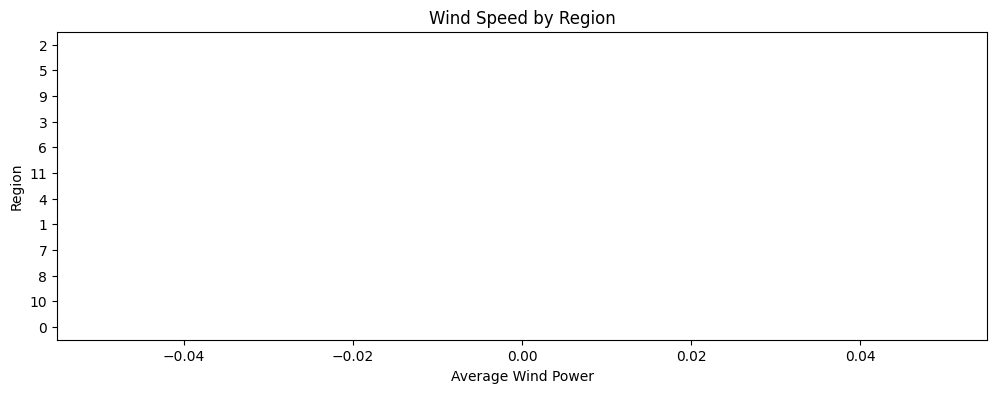

In [ ]:
# Plot wind power by region
plt.figure(figsize=(12,4))
reg_energy = regional_energy.set_index('Region')
sns.barplot(data=reg_energy, x='wind_speed_10m', y=reg_energy.index,
            palette='Blues', width=0.8, hue='wind', order=regional_energy.sort_values('wind_speed_10m', ascending=False).index)
plt.title('Wind Speed by Region')
plt.xlabel('').remove()
plt.ylabel('Region')
plt.legend().remove()

In [12]:
print(pd.Series(df['region'].unique()).to_latex(index=False))

\begin{tabular}{l}
\toprule
0 \\
\midrule
Auvergne-Rhône-Alpes \\
Bourgogne-Franche-Comté \\
Pays-de-la-Loire \\
Bretagne \\
Centre-Val de Loire \\
Grand-Est \\
Hauts-de-France \\
Ile-de-France \\
Normandie \\
Nouvelle-Aquitaine \\
Occitanie \\
PACA \\
\bottomrule
\end{tabular}



## ENERGY-WEATHER EDA

In [10]:
filtered_df = df_both[df_both['is_day']==1][['solar', 'region']]

# filtered_df = filtered_df.groupby('region').mean().reset_index()
# filtered_df.sort_values(by='solar')

In [25]:
filtered_df.describe()

,solar
count,264477.000000
mean,249.201978
std,378.251738
min,0.000000
25%,21.000000
50%,89.500000
75%,301.500000
max,2877.000000


In [26]:
df_both.columns

Index(['region', 'wind', 'solar', 'temperature_2m', 'relative_humidity_2m',
       'apparent_temperature', 'precipitation', 'surface_pressure',
       'cloud_cover', 'wind_speed_10m', 'wind_direction_10m', 'wind_gusts_10m',
       'is_day', 'sunshine_duration', 'direct_radiation', 'diffuse_radiation',
       'solar_power_t-24', 'solar_power_t-168', 'wind_power_t-24',
       'wind_power_t-168', 'hour', 'month', 'year'],
      dtype='object')

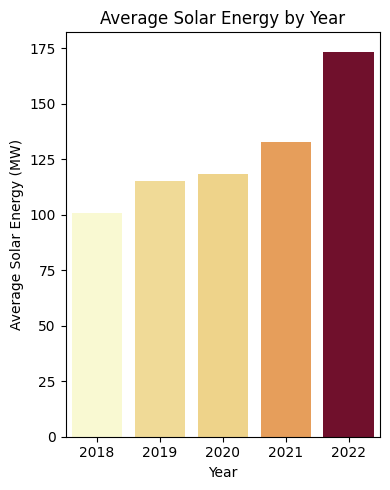

In [86]:
yearly_solar = df_both.groupby('year')['solar'].mean().reset_index()

plt.figure(figsize=(4, 5))
sns.barplot(data=yearly_solar, x='year', y='solar', palette='YlOrRd', hue='solar', legend=False)
plt.title('Average Solar Energy by Year')
plt.xlabel('Year')
plt.ylabel('Average Solar Energy (MW)')
plt.tight_layout()
plt.show()

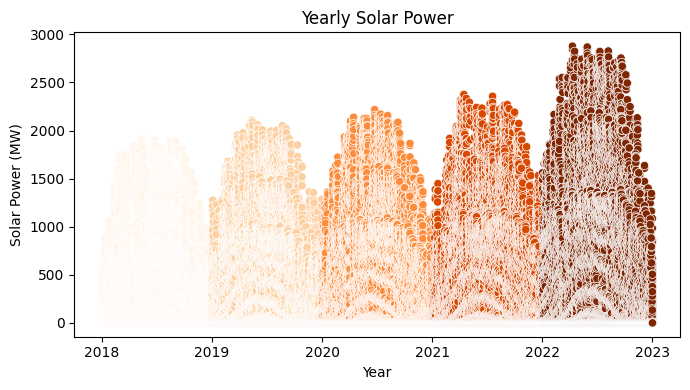

In [88]:
plt.figure(figsize=(7, 4))
data= df_both.reset_index()
sns.scatterplot(data=data, x='datetime', y='solar', hue='year', palette='Oranges',legend=False)
plt.title('Yearly Solar Power')
plt.xlabel('Year')
plt.ylabel('Solar Power (MW)')
plt.tight_layout()
plt.show()

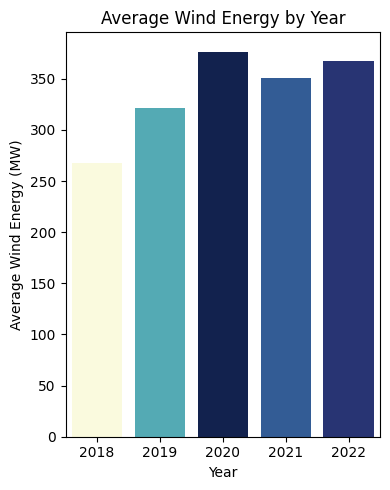

In [87]:
yearly_wind = df_both.groupby('year')['wind'].mean().reset_index()

plt.figure(figsize=(4, 5))
sns.barplot(data=yearly_wind, x='year', y='wind', palette='YlGnBu', hue='wind', legend=False)
plt.title('Average Wind Energy by Year')
plt.xlabel('Year')
plt.ylabel('Average Wind Energy (MW)')
plt.tight_layout()
plt.show()

In [ ]:
plt.figure(figsize=(7, 4))
data= df_both.reset_index()
sns.scatterplot(data=data, x='datetime', y='wind', hue='year', palette='husl', legend=False)
plt.title('Yearly Wind Power Trends')
plt.xlabel('Year')
plt.ylabel('Wind Power (MW)')
plt.tight_layout()
plt.show()

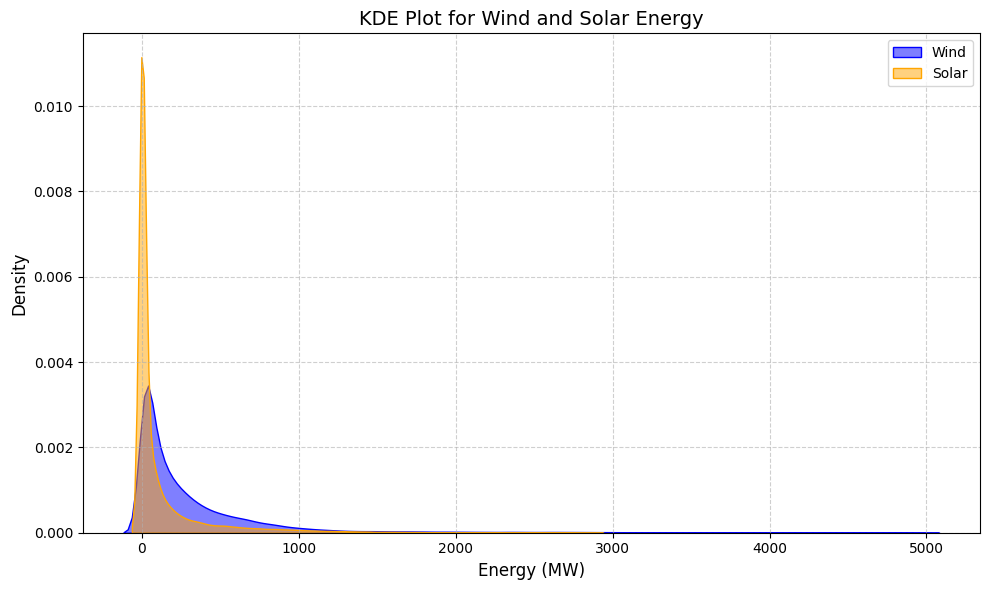

In [4]:
plt.figure(figsize=(10, 6))

#data = df_both[df_both['region'] == 'Nouvelle-Aquitaine']
data=df_both.copy()

# KDE plot for wind
sns.kdeplot(data['wind'], label='Wind', color='blue', fill=True, alpha=0.5)

# KDE plot for solar
sns.kdeplot(data['solar'], label='Solar', color='orange', fill=True, alpha=0.5)

plt.title('KDE Plot for Wind and Solar Energy', fontsize=14)
plt.xlabel('Energy (MW)', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

<Axes: xlabel='month'>

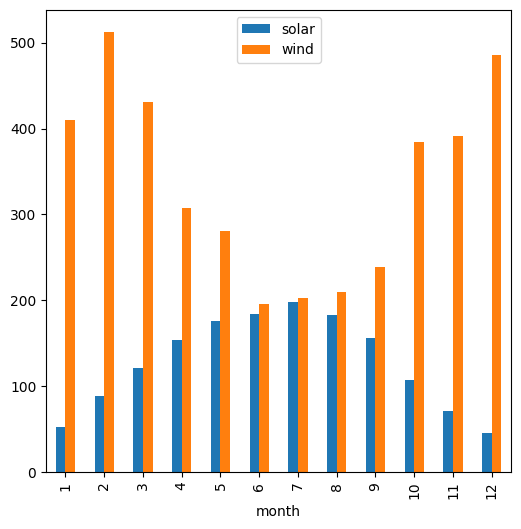

In [36]:
monthly_data = df_both.groupby('month')[['solar', 'wind']].mean().reset_index()
monthly_data.plot(x='month', y=['solar', 'wind'], kind='bar', figsize=(6, 6))

In [13]:
df_selected = df_both[energy_features + weather_features].copy()
df_selected['is_day'] = (df_selected['sunshine_duration'] > 0).astype(int)
df_selected['temp_humidity'] = df_selected['temperature_2m'] * df_selected['relative_humidity_2m']
df_selected['total_radiation'] = df_selected['direct_radiation'] + df_selected['diffuse_radiation']
df_selected['wind_speed_gusts'] = df_selected['wind_speed_10m'] * df_selected['wind_gusts_10m']

In [58]:
df_selected.columns

Index(['solar', 'wind', 'temperature_2m', 'relative_humidity_2m',
       'apparent_temperature', 'precipitation', 'surface_pressure',
       'cloud_cover', 'wind_speed_10m', 'wind_direction_10m', 'wind_gusts_10m',
       'is_day', 'sunshine_duration', 'direct_radiation', 'diffuse_radiation',
       'total_radiation', 'temp_humidity', 'wind_speed_gusts'],
      dtype='object')

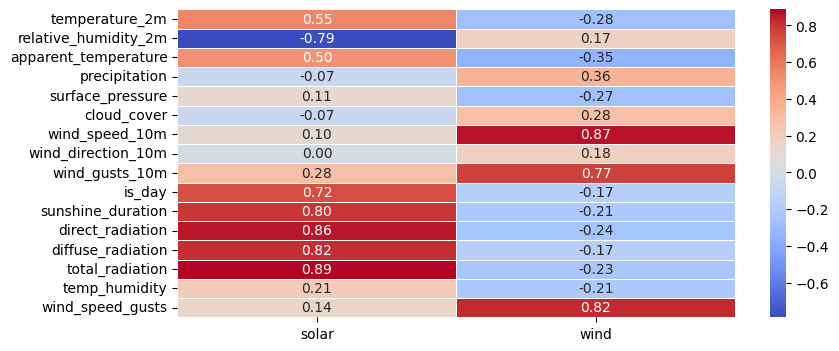

In [18]:
corr_plot = df_selected.groupby('datetime').mean()
correlation_matrix = corr_plot.corr()
cm_en = correlation_matrix.loc[energy_features, [column for column in df_selected.columns if column not in energy_features]]

fig, ax = plt.subplots(figsize=(9, 4))

sns.heatmap(cm_en.T, annot=True, cmap='coolwarm', fmt=".2f", ax=ax, linewidth=.5)
#ax.set_title('Weather-Energy Correlation Matrix')
fig.savefig('figures/correlation_matrix.png', dpi=300)

Text(0.5, 1.0, 'Weather-Energy Correlation Matrix')

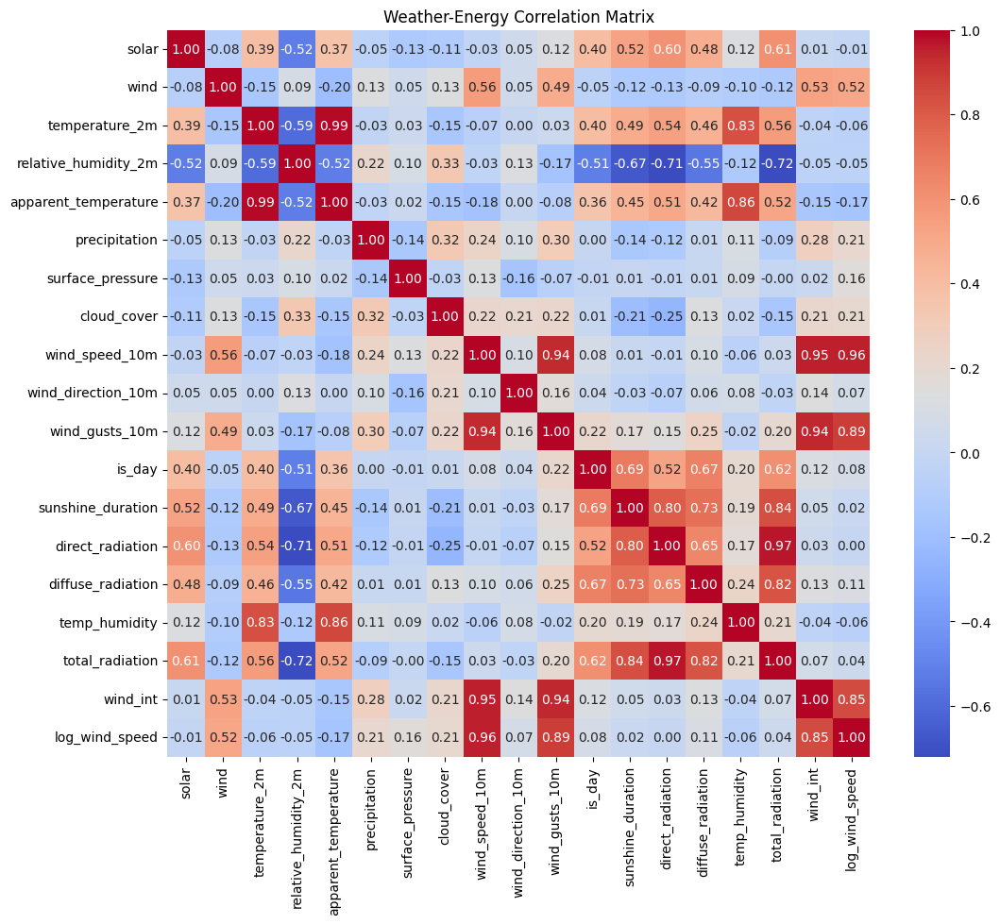

In [64]:
correlation_matrix = df_selected.corr()

fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", ax=ax)
ax.set_title('Weather-Energy Correlation Matrix')

In [14]:
df_selected.columns

Index(['solar', 'wind', 'temperature_2m', 'relative_humidity_2m',
       'apparent_temperature', 'precipitation', 'surface_pressure',
       'cloud_cover', 'wind_speed_10m', 'wind_direction_10m', 'wind_gusts_10m',
       'is_day', 'sunshine_duration', 'direct_radiation', 'diffuse_radiation',
       'total_radiation', 'temp_humidity', 'wind_speed_gusts'],
      dtype='object')

c:\Users\melan\Documents\U\Clases\Cuarto\TFG\tfg-final\.venv\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
c:\Users\melan\Documents\U\Clases\Cuarto\TFG\tfg-final\.venv\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
c:\Users\melan\Documents\U\Clases\Cuarto\TFG\tfg-final\.venv\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
c:\Users\melan\Documents\U\Clases\Cuarto\TFG\tfg-final\.venv\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
c:\Users\melan\Documents\U\Clases\Cuarto\TFG\tfg-final\.venv\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because

Text(0.5, 1.0, 'Weather-Energy Distribution Matrix')

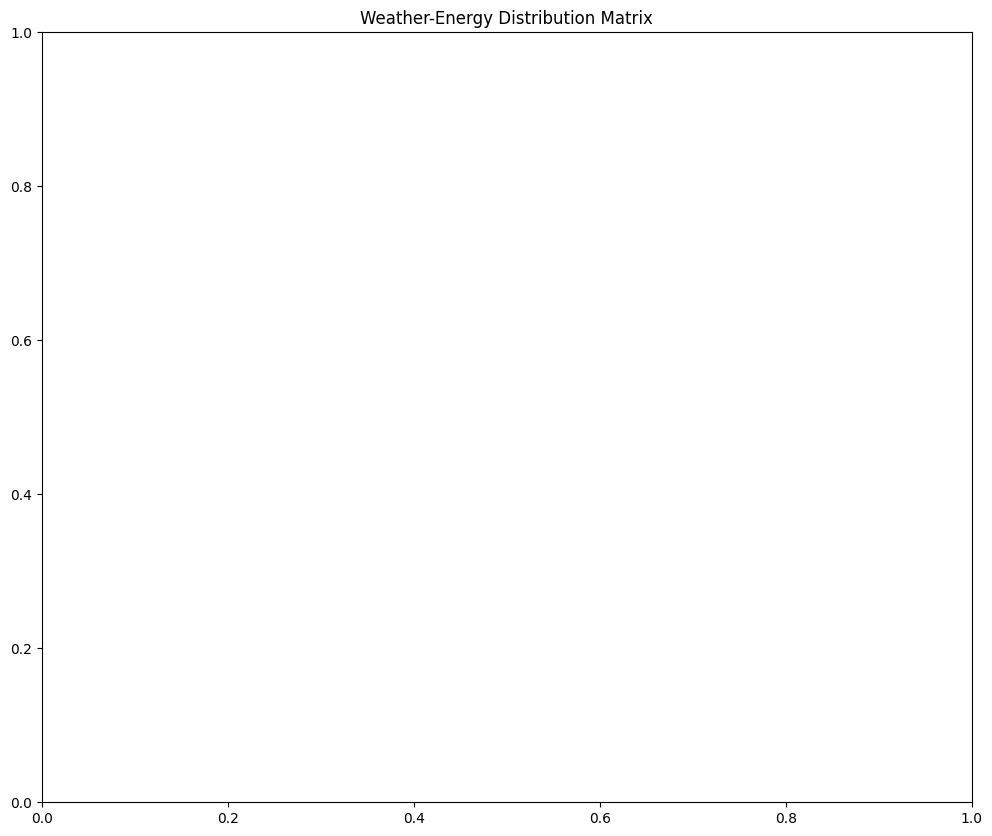

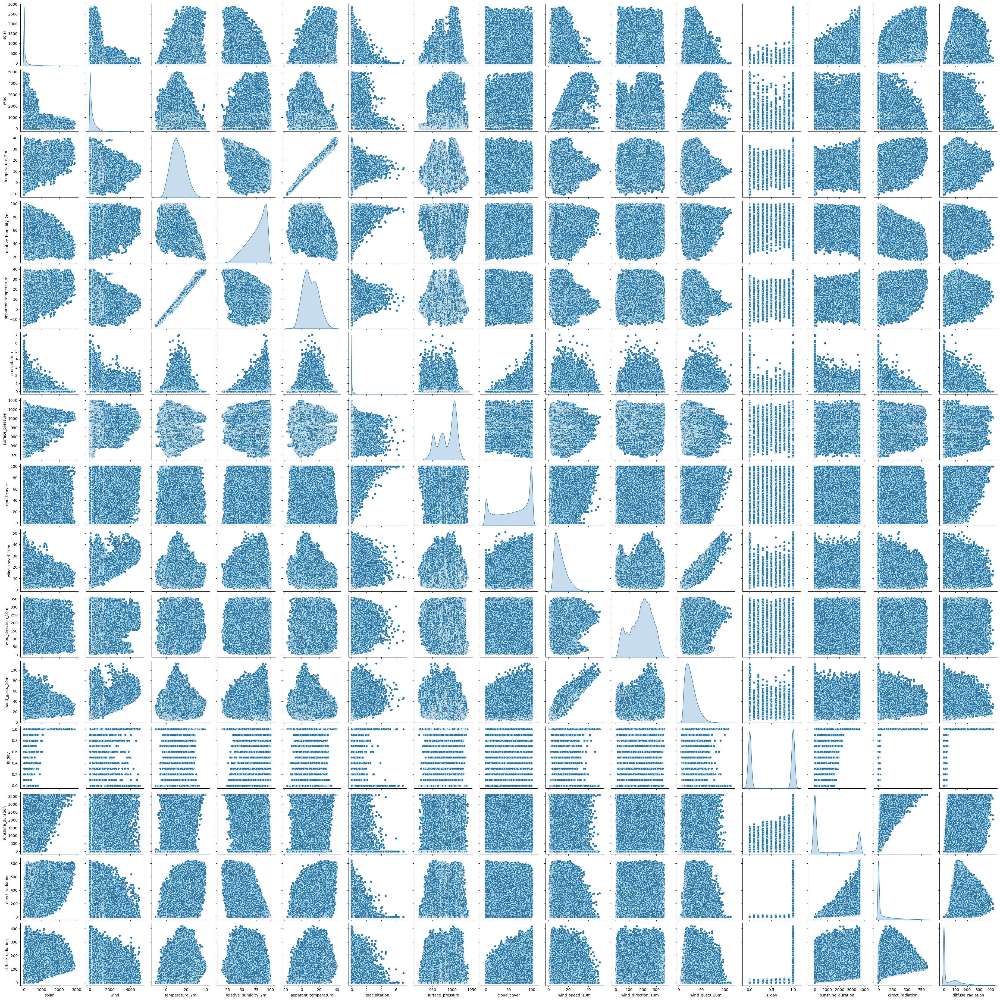

In [9]:
fig, ax = plt.subplots(figsize=(12, 10))
sns.pairplot(df_selected, diag_kind='kde')
ax.set_title('Weather-Energy Distribution Matrix')

In [25]:
invalid_is_day_indices = df_both[(df_both['is_day'] != 1) & (df_both['is_day'] != 0)].index
invalid_is_day_indices

DatetimeIndex(['2018-01-29 07:00:00', '2018-01-30 07:00:00',
               '2018-01-31 07:00:00', '2018-02-01 07:00:00',
               '2018-02-02 07:00:00', '2018-02-03 07:00:00',
               '2018-02-04 07:00:00', '2018-02-05 07:00:00',
               '2018-02-06 07:00:00', '2018-02-06 17:00:00',
               ...
               '2022-12-18 16:00:00', '2022-12-19 16:00:00',
               '2022-12-20 16:00:00', '2022-12-21 16:00:00',
               '2022-12-22 16:00:00', '2022-12-23 16:00:00',
               '2022-12-24 16:00:00', '2022-12-25 16:00:00',
               '2022-12-26 16:00:00', '2022-12-27 16:00:00'],
              dtype='datetime64[ns]', name='datetime', length=7304, freq=None)

In [8]:
#df_both['is_day'] = df_both['solar'].apply(lambda x: 1 if x != 0 else 0)
df_both[(df_both['is_day'] != 1) & (df_both['is_day'] != 0)]['is_day']

datetime
2018-01-29 07:00:00    0.1
2018-01-30 07:00:00    0.1
2018-01-31 07:00:00    0.3
2018-02-01 07:00:00    0.3
2018-02-02 07:00:00    0.4
                      ... 
2022-12-23 16:00:00    0.7
2022-12-24 16:00:00    0.8
2022-12-25 16:00:00    0.8
2022-12-26 16:00:00    0.8
2022-12-27 16:00:00    0.9
Name: is_day, Length: 7304, dtype: float64

### Weather Variables

In [64]:
#print(df_selected.columns)

eda_plot = df_both.copy().reset_index().drop(columns='region')
eda_plot= eda_plot.groupby('datetime').mean()

C:\Users\melan\AppData\Local\Temp\ipykernel_8028\4178561540.py:98: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[14].set_xticklabels(['Non Zero', 'Zero'])


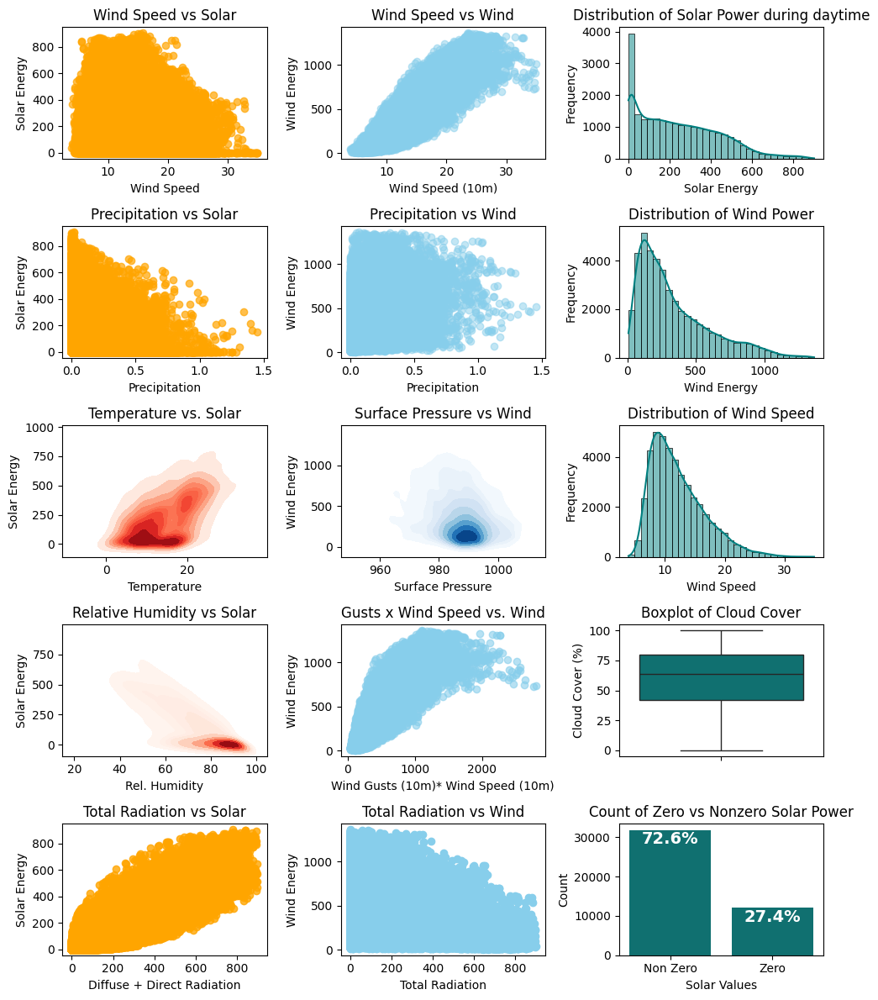

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(5, 3, figsize=(10, 12), sharex=False, sharey=False)
ax = ax.ravel()

ax[0].scatter(eda_plot['wind_speed_10m'],
            eda_plot['solar'], color='orange', alpha=0.7)
ax[0].set_title('Wind Speed vs Solar')
ax[0].set_xlabel('Wind Speed')
ax[0].set_ylabel('Solar Energy')

ax[1].scatter(eda_plot['wind_speed_10m'], eda_plot['wind'], alpha=0.5, color='skyblue')
ax[1].set_title('Wind Speed vs Wind')
ax[1].set_xlabel('Wind Speed (10m)')
ax[1].set_ylabel('Wind Energy')

eda_plot['is_day'] = (eda_plot['sunshine_duration'] > 0).astype(int)
filter_ = eda_plot[eda_plot['is_day'] != 0]
sns.histplot(x=filter_['solar'], bins=30, fill=True, kde=True, alpha=0.5, ax=ax[2], color='teal')
#ax[2].scatter(eda_plot['temperature_2m'], eda_plot['apparent_temperature'], alpha=0.5, color='cadetblue')
ax[2].set_title('Distribution of Solar Power during daytime')
ax[2].set_xlabel('Solar Energy')
ax[2].set_ylabel('Frequency')

ax[3].scatter(eda_plot['precipitation'], eda_plot['solar'], alpha=0.7, color='orange')
ax[3].set_title('Precipitation vs Solar')
ax[3].set_xlabel('Precipitation')
ax[3].set_ylabel('Solar Energy')

# 3. Precipitation vs Wind
ax[4].scatter(eda_plot['precipitation'], eda_plot['wind'], alpha=0.5, color='skyblue')
ax[4].set_title('Precipitation vs Wind')
ax[4].set_xlabel('Precipitation')
ax[4].set_ylabel('Wind Energy')


# 6. Histogram of relative humidity
sns.histplot(eda_plot['wind'], bins=30, fill=True, alpha=0.5, ax=ax[5], kde=True, color='teal')
ax[5].set_title('Distribution of Wind Power')
ax[5].set_xlabel('Wind Energy')
ax[5].set_ylabel('Frequency')

# 7. Diffuse vs Direct Radiation

sns.kdeplot(x=filter_['temperature_2m'], y=filter_['solar'], cmap='Reds', ax=ax[6], fill=True)
ax[6].set_title('Temperature vs. Solar')
ax[6].set_xlabel('Temperature')
ax[6].set_ylabel('Solar Energy')

# Surface Pressure vs Wind
sns.kdeplot(x=eda_plot['surface_pressure'], y=eda_plot['wind'], fill=True, cmap='Blues', ax=ax[7])
ax[7].set_title('Surface Pressure vs Wind')
ax[7].set_xlabel('Surface Pressure')
ax[7].set_ylabel('Wind Energy')


# 9. Histogram surface pressure
sns.histplot(eda_plot['wind_speed_10m'], bins=30, fill=True, alpha=0.5,
             kde=True, ax=ax[8], color='teal')
ax[8].set_title('Distribution of Wind Speed')
ax[8].set_xlabel('Wind Speed')
ax[8].set_ylabel('Frequency')


sns.kdeplot(x=eda_plot['relative_humidity_2m'], y=eda_plot['solar'], cmap='Reds', ax=ax[9], fill=True)
ax[9].set_xlabel('Rel. Humidity')
ax[9].set_ylabel('Solar Energy')
ax[9].set_title('Relative Humidity vs Solar')

ax[10].scatter(eda_plot['wind_gusts_10m']*eda_plot['wind_speed_10m'], eda_plot['wind'], alpha=0.6, color='skyblue')
ax[10].set_title('Gusts x Wind Speed vs. Wind')
ax[10].set_xlabel('Wind Gusts (10m)* Wind Speed (10m)')
ax[10].set_ylabel('Wind Energy')

sns.boxplot(eda_plot['cloud_cover'], ax=ax[11], color='teal')
ax[11].set_title('Boxplot of Cloud Cover')
ax[11].set_ylabel('Cloud Cover (%)')

eda_plot['total_radiation'] = eda_plot['diffuse_radiation']+eda_plot['direct_radiation']
ax[12].scatter(eda_plot['total_radiation'], eda_plot['solar'], alpha=0.8, color='orange')
ax[12].set_title('Total Radiation vs Solar')
ax[12].set_xlabel('Diffuse + Direct Radiation')
ax[12].set_ylabel('Solar Energy')

ax[13].scatter(eda_plot['total_radiation'], eda_plot['wind'], color='skyblue')
ax[13].set_xlabel('Total Radiation')
ax[13].set_ylabel('Wind Energy')
ax[13].set_title('Total Radiation vs Wind')

eda_plot['solar_is_zero'] = (eda_plot['solar'] == 0).astype(int)
sns.countplot(data=eda_plot, x='solar_is_zero', color='teal', ax=ax[14]) # Get the axes object from the plot
ax[14].set_xlabel('Solar Values')
ax[14].set_ylabel('Count')
ax[14].set_title('Count of Zero vs Nonzero Solar Power')
ax[14].set_xticklabels(['Non Zero', 'Zero'])

total = len(eda_plot['solar_is_zero'])

# Add percentages on top of the bars
for p in ax[14].patches:
    height = p.get_height()
    ax[14].annotate(f'{height/total:.1%}', # Format as percentage with one decimal place
                (p.get_x() + p.get_width() / 2., height), # Position the text above the bar
                ha='center', # Center the text horizontally
                va='center', # Center the text vertically
                xytext=(0, -8), # Offset the text slightly above the bar
                textcoords='offset points',
                fontsize='14', fontweight='bold', color='white')

#fig.savefig('figures/eda_plots.png', dpi=400, bbox_inches='tight')
plt.tight_layout()
plt.show()

In [18]:
fig.savefig('figures/eda_plots.png', dpi=400, bbox_inches='tight')

Separate plots - solar and wind

In [16]:
eda_plot = df_selected.reset_index().groupby('datetime').mean()
eda_plot

,solar,wind,temperature_2m,relative_humidity_2m,apparent_temperature,precipitation,surface_pressure,cloud_cover,wind_speed_10m,wind_direction_10m,wind_gusts_10m,is_day,sunshine_duration,direct_radiation,diffuse_radiation,total_radiation,temp_humidity,wind_speed_gusts
datetime,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,0.000000,895.250000,7.108333,79.166667,2.139167,0.179167,982.496667,63.625000,24.010833,248.700000,52.122500,0.0,0.0,0.0,0.0,0.0,558.577417,1339.664800
2018-01-01 01:00:00,0.000000,886.833333,7.008333,78.858333,1.990833,0.190000,982.944167,65.791667,24.122500,252.266667,50.473333,0.0,0.0,0.0,0.0,0.0,547.343083,1295.082892
2018-01-01 02:00:00,0.000000,874.375000,6.839167,78.066667,1.751667,0.207500,983.505000,61.983333,24.244167,250.416667,52.031667,0.0,0.0,0.0,0.0,0.0,527.148583,1316.678050
2018-01-01 03:00:00,0.000000,854.583333,6.725833,78.025000,1.733333,0.180000,983.889167,64.716667,23.424167,249.950000,50.815000,0.0,0.0,0.0,0.0,0.0,518.709917,1243.142658
2018-01-01 04:00:00,0.000000,826.541667,6.563333,78.566667,1.646667,0.126667,983.793333,67.091667,22.819167,250.508333,48.829167,0.0,0.0,0.0,0.0,0.0,511.297167,1163.296825
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 19:00:00,0.083333,1353.000000,13.060833,69.016667,8.908333,0.106667,986.795000,69.816667,23.681667,188.266667,46.651667,0.0,0.0,0.0,0.0,0.0,876.179833,1177.801617
2022-12-31 20:00:00,0.041667,1360.541667,12.865000,69.316667,8.700000,0.069167,987.235833,67.358333,23.536667,186.333333,46.815833,0.0,0.0,0.0,0.0,0.0,865.008250,1169.596858
2022-12-31 21:00:00,0.000000,1359.541667,12.640833,70.291667,8.475000,0.045000,987.628333,67.300000,23.526667,188.491667,46.710000,0.0,0.0,0.0,0.0,0.0,863.045833,1163.438033


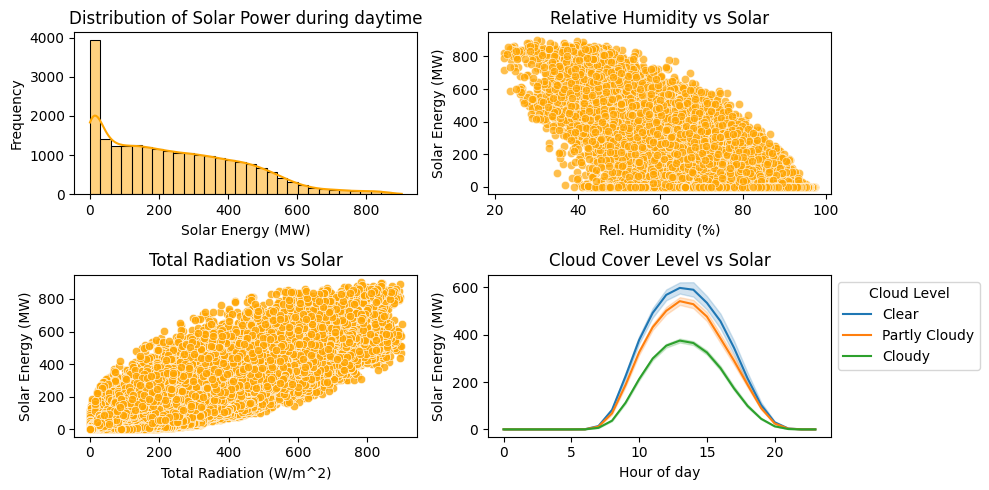

In [19]:
fig, ax = plt.subplots(2, 2, figsize=(10, 5), sharex=False, sharey=False)
ax = ax.ravel()

filter_ = eda_plot[eda_plot['is_day'] > 0]
sns.histplot(x=filter_['solar'], bins=30, fill=True, kde=True, alpha=0.5, color='orange', ax=ax[0])
ax[0].set_title('Distribution of Solar Power during daytime')
ax[0].set_xlabel('Solar Energy (MW)')
ax[0].set_ylabel('Frequency')

sns.scatterplot(x=eda_plot['relative_humidity_2m'], y=eda_plot['solar'], alpha=0.7, color='orange', ax=ax[1])
ax[1].set_title('Relative Humidity vs Solar')
ax[1].set_xlabel('Rel. Humidity (%)')
ax[1].set_ylabel('Solar Energy (MW)')

eda_plot['total_radiation'] = eda_plot['diffuse_radiation']+eda_plot['direct_radiation']
sns.scatterplot(x=eda_plot['total_radiation'], y=eda_plot['solar'], alpha=0.8, color='orange', ax=ax[2])
#ax[2].scatter(eda_plot['total_radiation'], eda_plot['solar'], alpha=0.8, color='orange')
ax[2].set_title('Total Radiation vs Solar')
ax[2].set_xlabel('Total Radiation (W/m^2)')
ax[2].set_ylabel('Solar Energy (MW)')

eda_plot['hour'] = eda_plot.index.hour
eda_plot['cloud_level'] = pd.cut(eda_plot['cloud_cover'], bins=[0, 20, 50, 100], labels=['Clear', 'Partly Cloudy', 'Cloudy'])
sns.lineplot(data=eda_plot, x='hour', y='solar', hue='cloud_level')
ax[3].set_title('Cloud Cover Level vs Solar')
ax[3].set_xlabel('Hour of day')
ax[3].set_ylabel('Solar Energy (MW)')
ax[3].legend(title='Cloud Level', bbox_to_anchor=(1, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [20]:
fig.savefig('figures/eda_plot_solar.png', dpi=400)

wind

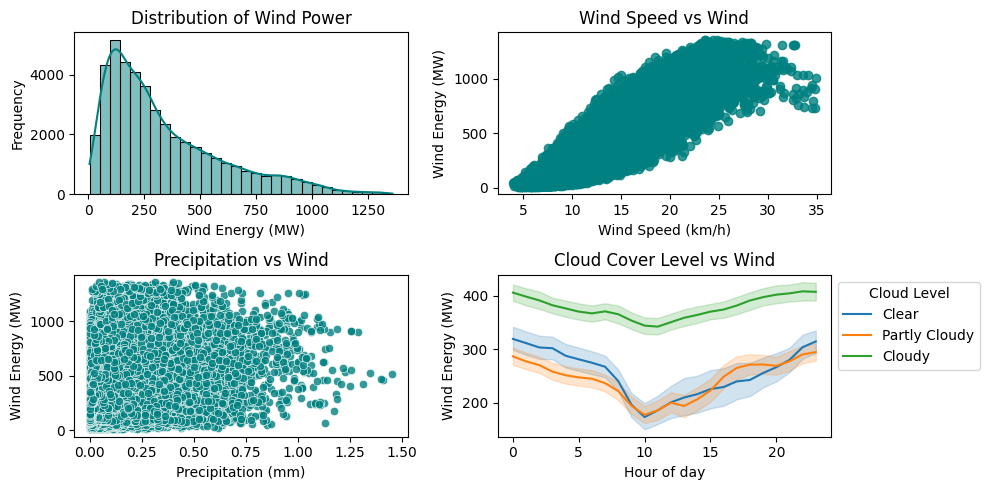

In [22]:
fig, ax = plt.subplots(2, 2, figsize=(10, 5), sharex=False, sharey=False)
ax = ax.ravel()

sns.histplot(x=eda_plot['wind'], bins=30, fill=True, kde=True, alpha=0.5, color='teal', ax=ax[0])
ax[0].set_title('Distribution of Wind Power')
ax[0].set_xlabel('Wind Energy (MW)')
ax[0].set_ylabel('Frequency')

ax[1].scatter(eda_plot['wind_speed_10m'], eda_plot['wind'], alpha=0.8, color='teal')
ax[1].set_title('Wind Speed vs Wind')
ax[1].set_xlabel('Wind Speed (km/h)')
ax[1].set_ylabel('Wind Energy (MW)')

sns.scatterplot(x=eda_plot['precipitation'], y=eda_plot['wind'], alpha=0.8, color='teal', ax=ax[2])
ax[2].set_title('Precipitation vs Wind')
ax[2].set_xlabel('Precipitation (mm)')
ax[2].set_ylabel('Wind Energy (MW)')

eda_plot['hour'] = eda_plot.index.hour
eda_plot['cloud_level'] = pd.cut(eda_plot['cloud_cover'], bins=[0, 20, 50, 100], labels=['Clear', 'Partly Cloudy', 'Cloudy'])
sns.lineplot(data=eda_plot, x='hour', y='wind', hue='cloud_level')
ax[3].set_title('Cloud Cover Level vs Wind')
ax[3].set_xlabel('Hour of day')
ax[3].set_ylabel('Wind Energy (MW)')
ax[3].legend(title='Cloud Level', bbox_to_anchor=(1, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [23]:
fig.savefig('figures/eda_plot_wind.png', dpi=400)

In [49]:
avgs = df_both.reset_index().drop(columns='region')
avgs= avgs.groupby('datetime').mean()
avgs.head(3)

,wind,solar,temperature_2m,relative_humidity_2m,apparent_temperature,precipitation,surface_pressure,cloud_cover,wind_speed_10m,wind_direction_10m,...,sunshine_duration,direct_radiation,diffuse_radiation,solar_power_t-24,solar_power_t-168,wind_power_t-24,wind_power_t-168,hour,month,year
datetime,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,895.250000,0.0,7.108333,79.166667,2.139167,0.179167,982.496667,63.625000,24.010833,248.700000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2018.0
2018-01-01 01:00:00,886.833333,0.0,7.008333,78.858333,1.990833,0.190000,982.944167,65.791667,24.122500,252.266667,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,2018.0
2018-01-01 02:00:00,874.375000,0.0,6.839167,78.066667,1.751667,0.207500,983.505000,61.983333,24.244167,250.416667,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,2018.0


Conclusions:
1. Total Radiation
2. Apparent temperature is not informative
3. Temp*Humidity

In [17]:
eda_plot[['solar', 'wind']].describe()

,solar,wind
count,43824.000000,43824.000000
mean,128.104813,336.863255
std,186.172119,260.793020
min,0.000000,6.666667
25%,0.000000,137.458333
50%,4.166667,256.062500
75%,227.677083,471.791667
max,902.416667,1360.541667


In [13]:
avg_region_stats = round(df_both.groupby('region')[['solar']].describe(), 2)
print(avg_region_stats.to_latex(float_format="%.2f"))

\begin{tabular}{lrrrrrrrr}
\toprule
 & \multicolumn{8}{r}{solar} \\
 & count & mean & std & min & 25% & 50% & 75% & max \\
region &  &  &  &  &  &  &  &  \\
\midrule
Auvergne-Rhône-Alpes & 43824.00 & 163.64 & 250.08 & 0.00 & 0.00 & 3.50 & 268.50 & 1231.00 \\
Bourgogne-Franche-Comté & 43824.00 & 48.77 & 78.68 & 0.00 & 0.00 & 1.00 & 75.00 & 463.50 \\
Bretagne & 43824.00 & 32.01 & 49.04 & 0.00 & 0.00 & 1.00 & 52.50 & 269.00 \\
Centre-Val de Loire & 43824.00 & 58.86 & 100.27 & 0.00 & 0.00 & 1.00 & 86.12 & 604.00 \\
Grand-Est & 43824.00 & 107.05 & 167.22 & 0.00 & 0.00 & 2.50 & 167.50 & 916.00 \\
Hauts-de-France & 43824.00 & 27.99 & 49.39 & 0.00 & 0.00 & 0.50 & 39.00 & 301.50 \\
Ile-de-France & 43824.00 & 15.67 & 25.64 & 0.00 & 0.00 & 0.00 & 23.50 & 148.00 \\
Normandie & 43824.00 & 23.20 & 36.09 & 0.00 & 0.00 & 0.50 & 37.50 & 186.00 \\
Nouvelle-Aquitaine & 43824.00 & 417.78 & 618.32 & 0.00 & 0.00 & 10.50 & 722.00 & 2877.00 \\
Occitanie & 43824.00 & 326.33 & 479.58 & 0.00 & 0.00 & 8.50 & 573.

In [12]:
avg_region_stats = round(df_both.groupby('region')[['wind']].describe(), 2)
print(avg_region_stats.to_latex(float_format="%.2f"))

\begin{tabular}{lrrrrrrrr}
\toprule
 & \multicolumn{8}{r}{wind} \\
 & count & mean & std & min & 25% & 50% & 75% & max \\
region &  &  &  &  &  &  &  &  \\
\midrule
Auvergne-Rhône-Alpes & 43824.00 & 141.67 & 105.96 & 0.00 & 56.50 & 117.50 & 205.00 & 595.00 \\
Bourgogne-Franche-Comté & 43824.00 & 204.49 & 188.93 & 0.00 & 52.50 & 143.00 & 309.50 & 941.00 \\
Bretagne & 43824.00 & 227.52 & 213.39 & 0.00 & 64.50 & 159.00 & 324.50 & 1065.50 \\
Centre-Val de Loire & 43824.00 & 307.76 & 289.35 & 0.00 & 78.00 & 213.50 & 461.50 & 1342.50 \\
Grand-Est & 43824.00 & 881.88 & 857.93 & 1.00 & 201.00 & 584.50 & 1320.62 & 4027.00 \\
Hauts-de-France & 43824.00 & 1115.82 & 1071.57 & 2.50 & 280.50 & 742.00 & 1641.00 & 4964.50 \\
Ile-de-France & 43824.00 & 26.65 & 27.67 & 0.00 & 5.50 & 17.00 & 40.50 & 144.50 \\
Normandie & 43824.00 & 204.74 & 193.97 & 0.00 & 52.50 & 135.50 & 303.00 & 862.00 \\
Nouvelle-Aquitaine & 43824.00 & 268.48 & 241.32 & 3.00 & 79.00 & 194.00 & 392.50 & 1351.50 \\
Occitanie & 43824.00

## MI scores

In [20]:
#eda_plot.columns
df_selected.columns

Index(['solar', 'wind', 'temperature_2m', 'relative_humidity_2m',
       'apparent_temperature', 'precipitation', 'surface_pressure',
       'cloud_cover', 'wind_speed_10m', 'wind_direction_10m', 'wind_gusts_10m',
       'is_day', 'sunshine_duration', 'direct_radiation', 'diffuse_radiation',
       'total_radiation', 'temp_humidity', 'wind_speed_gusts'],
      dtype='object')

In [11]:
df_selected['is_day'] = (df_selected['sunshine_duration'] > 0).astype(int)

(array([281184.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0., 244704.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

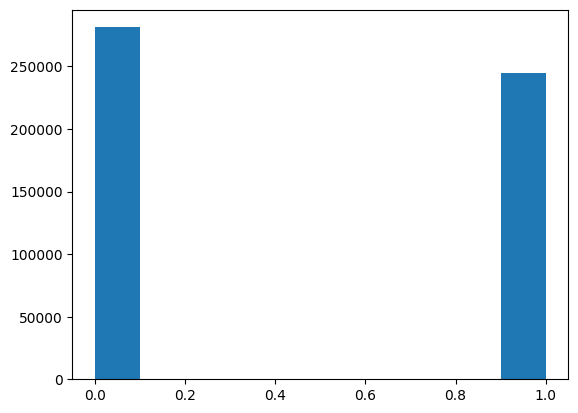

In [21]:
plt.hist(df_selected['is_day'])

In [22]:
df_selected

,solar,wind,temperature_2m,relative_humidity_2m,apparent_temperature,precipitation,surface_pressure,cloud_cover,wind_speed_10m,wind_direction_10m,wind_gusts_10m,is_day,sunshine_duration,direct_radiation,diffuse_radiation,total_radiation,temp_humidity,wind_speed_gusts
datetime,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,0.0,280.0,5.35,87.5,2.25,0.43,946.95,92.2,10.75,233.9,29.61,0,0.0,0.0,0.0,0.0,468.125,318.3075
2018-01-01 01:00:00,0.0,264.0,5.01,86.8,2.03,0.51,947.39,87.7,9.42,235.1,31.83,0,0.0,0.0,0.0,0.0,434.868,299.8386
2018-01-01 02:00:00,0.0,267.0,4.33,87.5,1.34,0.37,947.99,86.4,8.92,206.6,29.55,0,0.0,0.0,0.0,0.0,378.875,263.5860
2018-01-01 03:00:00,0.0,257.5,4.23,85.6,1.18,0.32,948.46,86.7,8.79,244.1,26.03,0,0.0,0.0,0.0,0.0,362.088,228.8037
2018-01-01 04:00:00,0.0,232.0,4.17,85.5,0.95,0.23,948.50,78.7,9.70,247.2,26.39,0,0.0,0.0,0.0,0.0,356.535,255.9830
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 19:00:00,0.0,70.5,9.23,89.3,7.07,0.00,962.34,57.2,11.07,144.7,26.89,0,0.0,0.0,0.0,0.0,824.239,297.6723
2022-12-31 20:00:00,0.0,70.5,8.93,90.2,6.74,0.00,962.45,58.8,11.07,114.3,27.62,0,0.0,0.0,0.0,0.0,805.486,305.7534
2022-12-31 21:00:00,0.0,72.5,8.83,91.2,6.71,0.00,962.59,80.6,10.62,115.2,27.94,0,0.0,0.0,0.0,0.0,805.296,296.7228


In [24]:
from sklearn.feature_selection import mutual_info_regression

# Define the target variable (y) and features (X)
y = df_selected['solar']
X = df_selected.drop(columns=['solar', 'wind'])

# Compute MI scores
mi_scores = mutual_info_regression(X, y, random_state=42)

# Create a DataFrame to display the scores
mi_scores_df = pd.DataFrame({'Feature': X.columns, 'MI Score': mi_scores})
mi_scores_df = mi_scores_df.sort_values(by='MI Score', ascending=False)

print('solar', mi_scores_df)

solar                  Feature  MI Score
13       total_radiation  0.630114
11      direct_radiation  0.593871
12     diffuse_radiation  0.588282
10     sunshine_duration  0.476879
9                 is_day  0.423440
1   relative_humidity_2m  0.277197
0         temperature_2m  0.154041
2   apparent_temperature  0.126492
8         wind_gusts_10m  0.064220
4       surface_pressure  0.062159
14         temp_humidity  0.054409
15      wind_speed_gusts  0.033807
5            cloud_cover  0.019557
6         wind_speed_10m  0.012677
7     wind_direction_10m  0.012556
3          precipitation  0.006335


In [25]:
print(mi_scores_df.to_latex(index=False, float_format='%0.4f'))

\begin{tabular}{lr}
\toprule
Feature & MI Score \\
\midrule
total_radiation & 0.6301 \\
direct_radiation & 0.5939 \\
diffuse_radiation & 0.5883 \\
sunshine_duration & 0.4769 \\
is_day & 0.4234 \\
relative_humidity_2m & 0.2772 \\
temperature_2m & 0.1540 \\
apparent_temperature & 0.1265 \\
wind_gusts_10m & 0.0642 \\
surface_pressure & 0.0622 \\
temp_humidity & 0.0544 \\
wind_speed_gusts & 0.0338 \\
cloud_cover & 0.0196 \\
wind_speed_10m & 0.0127 \\
wind_direction_10m & 0.0126 \\
precipitation & 0.0063 \\
\bottomrule
\end{tabular}



In [26]:
from sklearn.feature_selection import mutual_info_regression

# Define the target variable (y) and features (X)
y = df_selected['wind']
X = df_selected.drop(columns=['solar', 'wind'])

# Compute MI scores
mi_scores = mutual_info_regression(X, y, random_state=42)

# Create a DataFrame to display the scores
mi_scores_df = pd.DataFrame({'Feature': X.columns, 'MI Score': mi_scores})
mi_scores_df = mi_scores_df.sort_values(by='MI Score', ascending=False)

print(mi_scores_df)

                 Feature  MI Score
6         wind_speed_10m  0.327529
15      wind_speed_gusts  0.288229
8         wind_gusts_10m  0.227105
4       surface_pressure  0.085913
2   apparent_temperature  0.047833
0         temperature_2m  0.038044
7     wind_direction_10m  0.033984
3          precipitation  0.028429
1   relative_humidity_2m  0.026730
11      direct_radiation  0.021265
10     sunshine_duration  0.020320
14         temp_humidity  0.018903
13       total_radiation  0.018508
5            cloud_cover  0.017897
12     diffuse_radiation  0.011231
9                 is_day  0.007201


In [27]:
print(mi_scores_df.to_latex(index=False, float_format='%0.4f'))

\begin{tabular}{lr}
\toprule
Feature & MI Score \\
\midrule
wind_speed_10m & 0.3275 \\
wind_speed_gusts & 0.2882 \\
wind_gusts_10m & 0.2271 \\
surface_pressure & 0.0859 \\
apparent_temperature & 0.0478 \\
temperature_2m & 0.0380 \\
wind_direction_10m & 0.0340 \\
precipitation & 0.0284 \\
relative_humidity_2m & 0.0267 \\
direct_radiation & 0.0213 \\
sunshine_duration & 0.0203 \\
temp_humidity & 0.0189 \\
total_radiation & 0.0185 \\
cloud_cover & 0.0179 \\
diffuse_radiation & 0.0112 \\
is_day & 0.0072 \\
\bottomrule
\end{tabular}



RFE XGBOOST

In [30]:
from sklearn.feature_selection import RFE, RFECV
from sklearn.model_selection import TimeSeriesSplit

In [45]:
y = df_selected['solar']
X = df_selected.drop(columns=['solar', 'wind', 'diffuse_radiation', 'direct_radiation'])

X_train, y_train = X[X.index.year < 2022], y[y.index.year < 2022]
X_test, y_test = X[X.index.year == 2022], y[y.index.year == 2022]

model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
model.fit(X_train, y_train)

feature_imp_s = model.feature_importances_

feature_imp_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_imp_s
}).sort_values(by='Importance', ascending=False)

# # Plot 
# plt.figure(figsize=(6, 4))
# plt.barh(feature_imp_df['Feature'], feature_imp_df['Importance'])
# plt.xlabel('Importance')
# plt.ylabel('Feature')
# plt.title('Solar Feature Importance from XGBoost')
# plt.gca().invert_yaxis()
# plt.show()

rfe = RFE(estimator=model, n_features_to_select=6)
rfe.fit(X_train, y_train)

print("Selected features:")
selected_features = X_train.columns[rfe.support_]
print(selected_features)

Selected features:
Index(['relative_humidity_2m', 'surface_pressure', 'wind_speed_10m',
       'wind_direction_10m', 'wind_gusts_10m', 'total_radiation'],
      dtype='object')


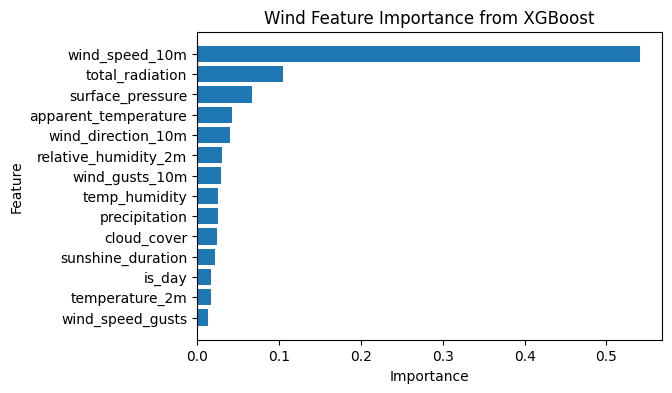

Selected features:
Index(['apparent_temperature', 'surface_pressure', 'wind_speed_10m',
       'wind_direction_10m', 'wind_gusts_10m', 'total_radiation'],
      dtype='object')


In [47]:
y = df_selected['wind']
X = df_selected.drop(columns=['solar', 'wind', 'diffuse_radiation', 'direct_radiation'])

X_train, y_train = X[X.index.year < 2022], y[y.index.year < 2022]
X_test, y_test = X[X.index.year == 2022], y[y.index.year == 2022]

model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
model.fit(X_train, y_train)

feature_imp_w = model.feature_importances_

feature_imp_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_imp_w
}).sort_values(by='Importance', ascending=False)

# Plot 
plt.figure(figsize=(6, 4))
plt.barh(feature_imp_df['Feature'], feature_imp_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Wind Feature Importance from XGBoost')
plt.gca().invert_yaxis()
plt.show()

rfe = RFE(estimator=model, n_features_to_select=6)
rfe.fit(X_train, y_train)

print("Selected features:")
selected_features = X_train.columns[rfe.support_]
print(selected_features)

In [48]:
print(feature_imp_df.to_latex(index=False, float_format='%.3f'))

\begin{tabular}{lr}
\toprule
Feature & Importance \\
\midrule
wind_speed_10m & 0.541 \\
total_radiation & 0.105 \\
surface_pressure & 0.067 \\
apparent_temperature & 0.043 \\
wind_direction_10m & 0.040 \\
relative_humidity_2m & 0.030 \\
wind_gusts_10m & 0.029 \\
temp_humidity & 0.026 \\
precipitation & 0.026 \\
cloud_cover & 0.024 \\
sunshine_duration & 0.022 \\
is_day & 0.017 \\
temperature_2m & 0.016 \\
wind_speed_gusts & 0.013 \\
\bottomrule
\end{tabular}



## Seasonality

KeyboardInterrupt: 

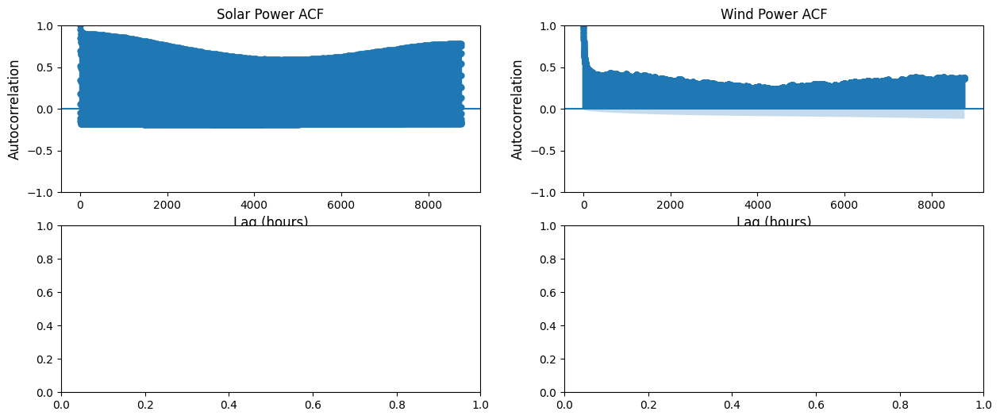

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(15, 6), sharey=False)

lag = 48
# plot solar acf
plot_acf(df_both['solar'], lags=lag, ax=axes[0, 0])
axes[0, 0].set_title('Solar Power ACF', fontsize=12)
axes[0,0].set_xlabel('Lag (hours)', fontsize=12)
axes[0,0].set_ylabel('Autocorrelation', fontsize=12)

plot_acf(df_both['wind'], lags=lag, ax=axes[0,1])
axes[0,1].set_title('Wind Power ACF', fontsize=12)
axes[0,1].set_xlabel('Lag (hours)', fontsize=12)
axes[0,1].set_ylabel('Autocorrelation', fontsize=12)

# plot solar pacf
plot_pacf(df_both['solar'], lags=lag, ax=axes[1,0])
axes[1,0].set_title('Solar Power PACF', fontsize=12)
axes[1,0].set_xlabel('Lag (hours)', fontsize=12)
axes[1,0].set_ylabel('Partial-Autocorrelation', fontsize=12)

plot_pacf(df_both['wind'], lags=lag, ax=axes[1,1])
axes[1,1].set_title('Wind Power PACF', fontsize=12)
axes[1,1].set_xlabel('Lag (hours)', fontsize=12)
axes[1,1].set_ylabel('Partial-Autocorrelation', fontsize=12)

plt.subplots_adjust(hspace=0.5)  # Increase the vertical space between rows
season = 'Yearly'
plt.suptitle(f'{season} ACF and PACF for Solar and Wind Power', fontsize=14)
plt.tight_layout()
plt.show()
fig.savefig(f'figures/{season}_acf_pacf.png', dpi=300, bbox_inches='tight')

In [18]:
df_both.index.day

Index([ 1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
       ...
       31, 31, 31, 31, 31, 31, 31, 31, 31, 31],
      dtype='int32', name='datetime', length=525888)

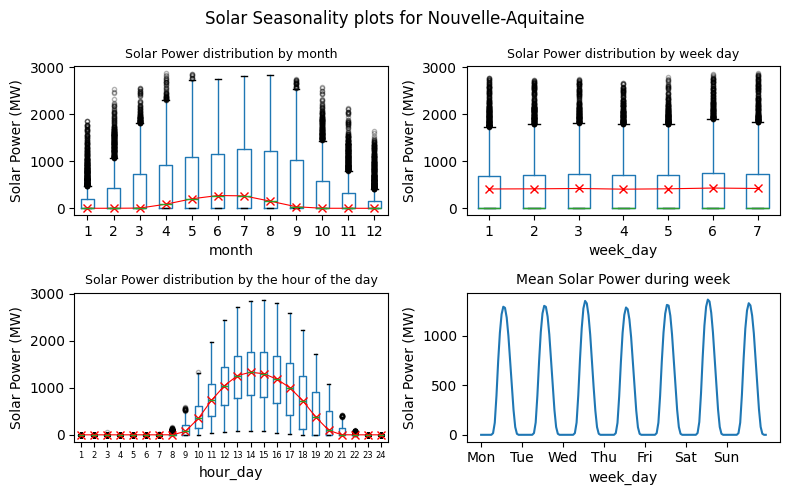

In [78]:
# Annual, weekly and daily seasonality for ONE REGION
# https://cienciadedatos.net/documentos/py29-forecasting-electricity-power-demand-python
# ==============================================================================
fig, axs = plt.subplots(2, 2, figsize=(8, 5), sharex=False, sharey=False)
axs = axs.ravel()

seasonality_df = df_both.copy()
chosen_region = 'Nouvelle-Aquitaine'
seasonality_df = seasonality_df[seasonality_df['region'] == chosen_region]

# Solar distribution by month
seasonality_df['month'] = seasonality_df.index.month
seasonality_df.boxplot(column='solar', by='month', ax=axs[0],
                 flierprops={'markersize': 3, 'alpha': 0.3})
seasonality_df.groupby('month')['solar'].median().plot(style='x-',
                                                       linewidth=0.8, ax=axs[0], color='red')
axs[0].set_ylabel('Solar Power (MW)')
axs[0].set_title('Solar Power distribution by month', fontsize=9)

# Solar distribution by week day
seasonality_df['week_day'] = seasonality_df.index.day_of_week + 1
seasonality_df.boxplot(column='solar', by='week_day', ax=axs[1],
                       flierprops={'markersize': 3, 'alpha': 0.3})
seasonality_df.groupby('week_day')['solar'].mean().plot(style='x-',
                                                          linewidth=0.8, ax=axs[1], color='red')
axs[1].set_ylabel('Solar Power (MW)')
axs[1].set_title('Solar Power distribution by week day', fontsize=9)

# Solar distribution by the hour of the day
seasonality_df['hour_day'] = seasonality_df.index.hour + 1
seasonality_df.boxplot(column='solar', by='hour_day', ax=axs[2],
                       flierprops={'markersize': 3, 'alpha': 0.3})
seasonality_df.groupby('hour_day')['solar'].median().plot(style='x-',
                                                      linewidth=0.8, ax=axs[2], color='red')
axs[2].set_ylabel('Solar Power (MW)')
axs[2].set_title('Solar Power distribution by the hour of the day', fontsize=9)
axs[2].tick_params(axis='x', labelsize=6)

# Solar distribution by week day and hour of the day
seasonality_df['hour'] = seasonality_df.index.hour
mean_day_hour = seasonality_df.groupby(["week_day", "hour"])["solar"].mean()
mean_day_hour.plot(ax=axs[3])
axs[3].set(
    title       = "Mean Solar Power during week",
    xticks      = [i * 24 for i in range(7)],
    xticklabels = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"],
    xlabel      = "week_day",
    ylabel      = "Solar Power (MW)"
)
axs[3].title.set_size(10)

fig.suptitle(f"Solar Seasonality plots for {chosen_region}", fontsize=12)
fig.tight_layout()
#fig.savefig('figures/solar_seasonality.png', dpi=300, bbox_inches='tight')

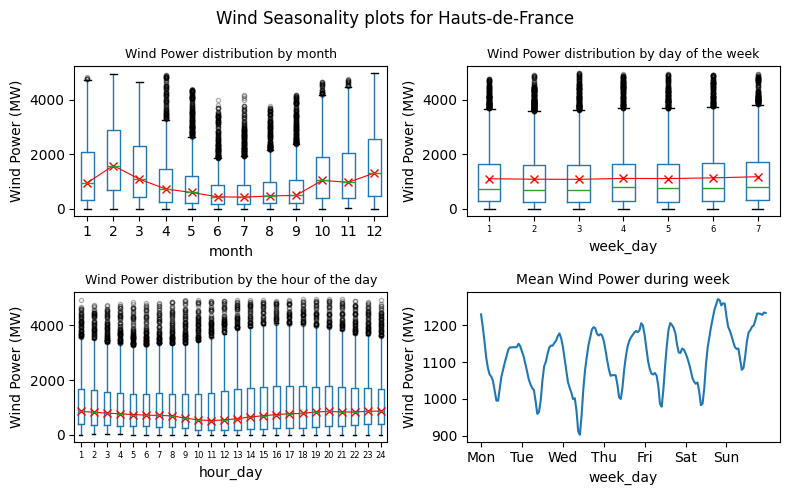

In [34]:
# Annual, weekly and daily seasonality for ONE REGION WIND
# https://cienciadedatos.net/documentos/py29-forecasting-electricity-power-demand-python
# ==============================================================================
fig, axs = plt.subplots(2, 2, figsize=(8, 5), sharex=False, sharey=False)
axs = axs.ravel()

seasonality_df = df_both.copy()
chosen_region = 'Hauts-de-France'
seasonality_df = seasonality_df[seasonality_df['region'] == chosen_region]

# Wind distribution by month
seasonality_df.boxplot(column='wind', by='month', ax=axs[0],
                 flierprops={'markersize': 3, 'alpha': 0.3})
seasonality_df.groupby('month')['wind'].median().plot(style='x-',
                                                       linewidth=0.8, ax=axs[0], color='red')
axs[0].set_ylabel('Wind Power (MW)')
axs[0].set_title('Wind Power distribution by month', fontsize=9)

# Wind distribution by week day
seasonality_df['day_month'] = seasonality_df.index.day
seasonality_df['week_day'] = seasonality_df.index.day_of_week + 1
seasonality_df.boxplot(column='wind', by='week_day', ax=axs[1],
                       flierprops={'markersize': 3, 'alpha': 0.3})
seasonality_df.groupby('week_day')['wind'].mean().plot(style='x-',
                                                          linewidth=0.8, ax=axs[1], color='red')
axs[1].set_ylabel('Wind Power (MW)')
axs[1].set_title('Wind Power distribution by day of the week', fontsize=9)
axs[1].tick_params(axis='x', labelsize=6)

# Wind distribution by the hour of the day
seasonality_df['hour_day'] = seasonality_df.index.hour + 1
seasonality_df.boxplot(column='wind', by='hour_day', ax=axs[2],
                       flierprops={'markersize': 3, 'alpha': 0.3})
seasonality_df.groupby('hour_day')['wind'].median().plot(style='x-',
                                                      linewidth=0.8, ax=axs[2], color='red')
axs[2].set_ylabel('Wind Power (MW)')
axs[2].set_title('Wind Power distribution by the hour of the day', fontsize=9)
# Adjust the fontsize of the x-axis ticks for axs[2]
axs[2].tick_params(axis='x', labelsize=6)

# Wind distribution by week day and hour of the day
mean_day_hour = seasonality_df.groupby(["week_day", "hour"])["wind"].mean()
mean_day_hour.plot(ax=axs[3])
axs[3].set(
    title       = "Mean Wind Power during week",
    xticks      = [i * 24 for i in range(7)],
    xticklabels = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"],
    xlabel      = "week_day",
    ylabel      = "Wind Power (MW)"
)
axs[3].title.set_size(10)

fig.suptitle(f"Wind Seasonality plots for {chosen_region}", fontsize=12)
fig.tight_layout()
fig.savefig('figures/wind_seasonality.png', dpi=300, bbox_inches='tight')

## Time series analysis

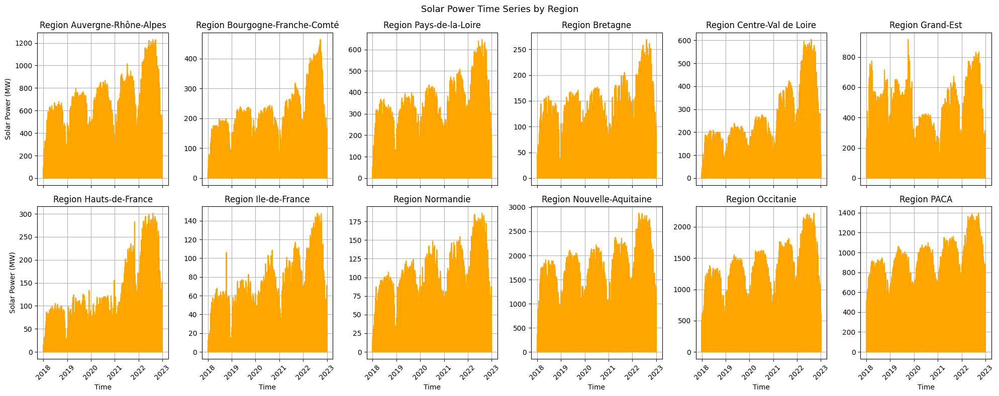

In [37]:
solar_ts = df_both[['solar', 'region']]

regions = solar_ts['region'].unique()
# Create a 2x6 grid of subplots
fig, axes = plt.subplots(2, 6, figsize=(20, 8), sharex=True, sharey=False)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each region and plot its time series
for i, region in enumerate(regions):
    # Filter data for the current region
    region_data = solar_ts[solar_ts['region'] == region]
    
    # Plot the time series
    axes[i].plot(region_data.index, region_data['solar'], label=f'Region {region}', color='orange')
    axes[i].set_title(f'Region {region}')
    axes[i].tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability
    axes[i].grid(True)
    
    # Add labels only to the leftmost and bottom plots
    if i % 6 == 0:  # Leftmost plots
        axes[i].set_ylabel('Solar Power (MW)')
    if i >= 6:  # Bottom plots
        axes[i].set_xlabel('Time')

# Hide unused subplots if regions < 12
for j in range(len(regions), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
fig.suptitle('Solar Power Time Series by Region', fontsize=13)
plt.tight_layout()
plt.show()
fig.savefig('figures/solar_power_time_series_by_region.png', dpi=300, bbox_inches='tight')

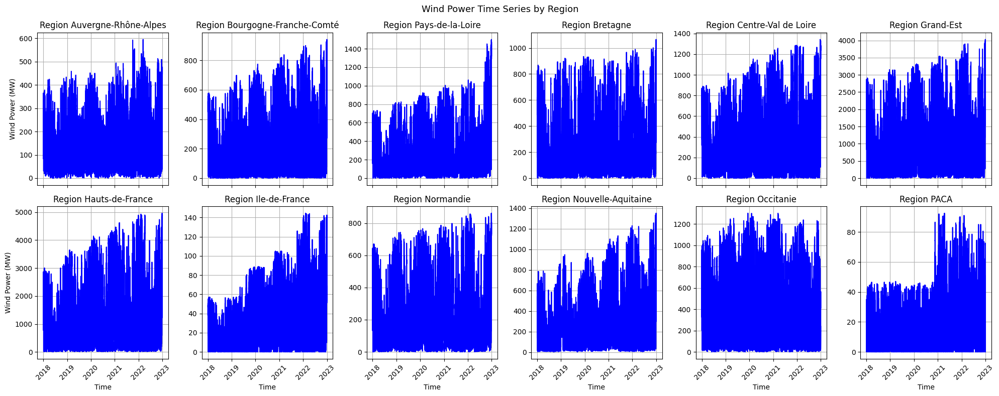

In [ ]:
wind_ts = df_both[['wind', 'region']]

regions = wind_ts['region'].unique()
# Create a 2x6 grid of subplots
fig, axes = plt.subplots(2, 6, figsize=(20, 8), sharex=False, sharey=False)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each region and plot its time series
for i, region in enumerate(regions):
    # Filter data for the current region
    region_data = wind_ts[wind_ts['region'] == region]
    
    # Plot the time series
    axes[i].plot(region_data.index, region_data['wind'], label=f'Region {region}', color='blue')
    axes[i].set_title(f'Region {region}')
    axes[i].tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability
    axes[i].grid(True)
    
    # Add labels only to the leftmost and bottom plots
    if i % 6 == 0:  # Leftmost plots
        axes[i].set_ylabel('Wind Power (MW)')
    if i >= 6:  # Bottom plots
        axes[i].set_xlabel('Time')

# Hide unused subplots if regions < 12
for j in range(len(regions), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
fig.suptitle('Wind Power Time Series by Region', fontsize=13)
plt.tight_layout()
plt.show()
fig.savefig('figures/wind_power_time_series_by_region.png', dpi=300, bbox_inches='tight')

TSLEARN

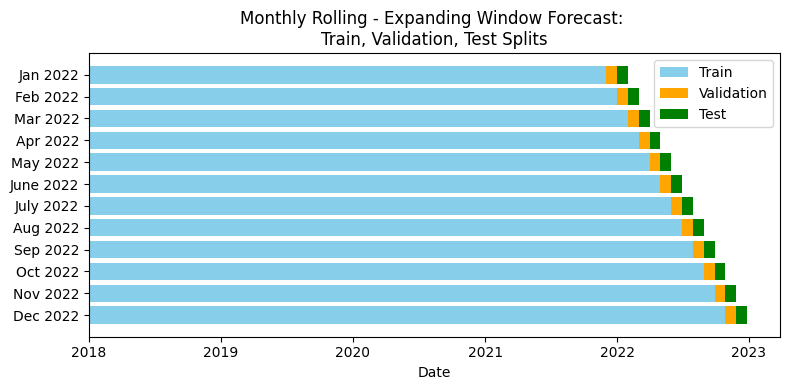

In [14]:
import matplotlib.pyplot as plt
import pandas as pd
from datetime import timedelta

# Setup
start_train = pd.to_datetime("2018-01-01")
initial_test_start = pd.to_datetime("2022-01-01")
final_test_end = pd.to_datetime("2022-12-01")
validation_days = 30
test_days = 30

months = []
train_bars = []
val_bars = []
test_bars = []

# Iterate over months in 2022
current_test_start = initial_test_start
while current_test_start <= final_test_end:
    current_test_end = current_test_start + timedelta(days=test_days - 1)
    current_val_start = current_test_start - timedelta(days=validation_days)
    current_train_end = current_val_start - timedelta(hours=1)

    months.append(current_test_start.strftime("%b %Y"))

    # Store tuples of (start, duration)
    train_bars.append((start_train, current_train_end - start_train))
    val_bars.append((current_val_start, timedelta(days=validation_days)))
    test_bars.append((current_test_start, timedelta(days=test_days)))

    # Advance to next month
    current_test_start = current_test_end + timedelta(days=1)

# Plotting
fig, ax = plt.subplots(figsize=(8, 4))

for i, month in enumerate(months):
    y = i  # Reverse y-axis so Jan is on top

    # Plot train
    train_start, train_dur = train_bars[i]
    ax.barh(y, train_dur.total_seconds()/86400, left=train_start, color='skyblue', label='Train' if i==0 else "")

    # Plot validation
    val_start, val_dur = val_bars[i]
    ax.barh(y, val_dur.total_seconds()/86400, left=val_start, color='orange', label='Validation' if i==0 else "")

    # Plot test
    test_start, test_dur = test_bars[i]
    ax.barh(y, test_dur.total_seconds()/86400, left=test_start, color='green', label='Test' if i==0 else "")

# Formatting
ax.set_yticks(range(len(months)))
months = ['Jan','Feb', 'Mar', 'Apr', 'May', 'June', 'July', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
months = [month+" "+str(2022) for month in months]
months
ax.set_yticklabels(months)
ax.invert_yaxis()
ax.set_xlabel("Date")
ax.set_title("Monthly Rolling - Expanding Window Forecast: \nTrain, Validation, Test Splits")
ax.legend()
plt.tight_layout()
plt.show()
fig.savefig(f"figures/train_val_test_splits.png", dpi=300)


### Seasonal decomposition

In [ ]:
#regions = ['Bretagne']

regions = df_both['region'].unique()
print(regions)

region_dfs = {}

for region in regions:
    region_data = df_both[df_both['region'] == region]
    region_data = region_data.drop(columns=['region'])
    region_dfs[region] = region_data.asfreq('h')

['Auvergne-Rhône-Alpes' 'Bourgogne-Franche-Comté' 'Pays-de-la-Loire'
 'Bretagne' 'Centre-Val de Loire' 'Grand-Est' 'Hauts-de-France'
 'Ile-de-France' 'Normandie' 'Nouvelle-Aquitaine' 'Occitanie' 'PACA']


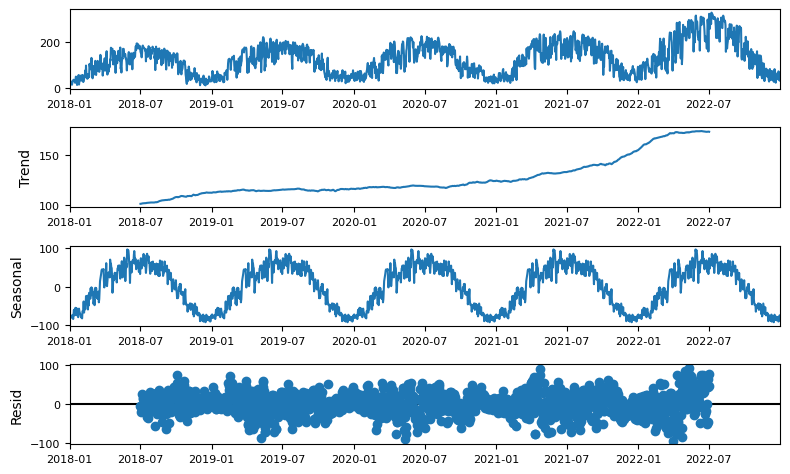

In [102]:
# region = regions[-1]
# bretagne = region_dfs[region]

daily_solar = df_both['solar'].resample('D').mean()
additive_decompositon = seasonal_decompose(daily_solar, model='additive', period=365)

plt.rcParams.update({'figure.figsize': (8,5)})
fig = additive_decompositon.plot()
fig.suptitle('')

for ax in fig.axes:
    ax.set_title("")
    ax.tick_params(labelbottom=True, labelsize=8) 

plt.tight_layout()
plt.show()
fig.savefig(f"figures/solar_seasonal_decomposition.png", dpi=400)

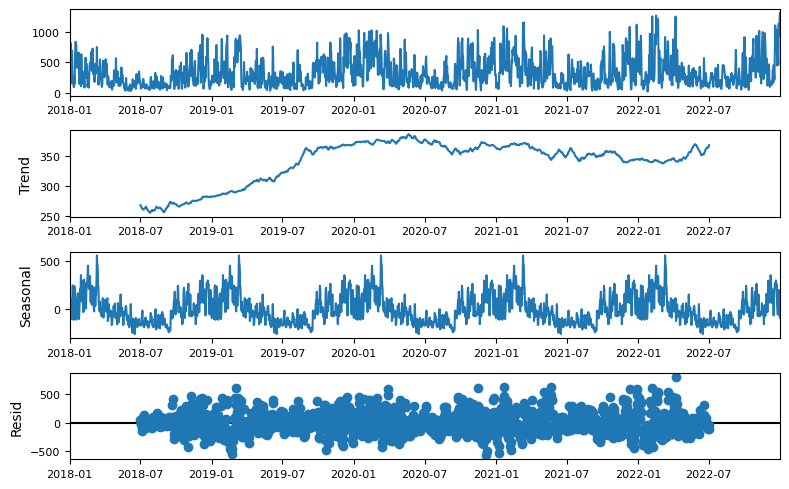

In [101]:
# region = regions[-1]
# bretagne = region_dfs[region]
daily_wind = df_both['wind'].resample('D').mean()

plt.rcParams.update({'figure.figsize': (8,5)})
additive_decompositon = seasonal_decompose(daily_wind, model='additive', period=365)
fig = additive_decompositon.plot()
for ax in fig.axes:
    ax.set_title("")
    ax.tick_params(labelbottom=True, labelsize=8) 

plt.tight_layout()
plt.show()
fig.savefig(f"figures/wind_seasonal_decomposition.png", dpi=400)


### Weekly seasonality

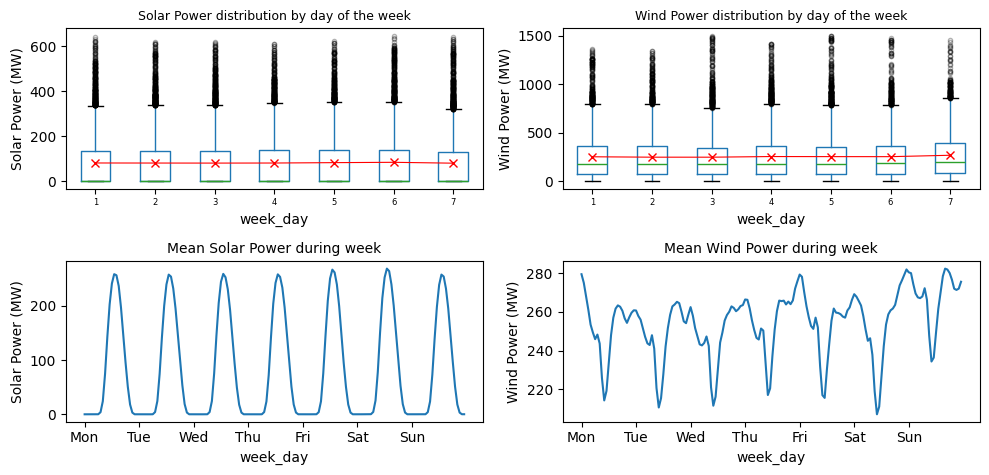

In [67]:
# Annual, weekly and daily seasonality for ONE REGION WIND
# https://cienciadedatos.net/documentos/py29-forecasting-electricity-power-demand-python
# ==============================================================================
fig, axs = plt.subplots(2, 2, figsize=(10, 5), sharex=False, sharey=False)
axs = axs.ravel()

seasonality_df = df_both.copy()
chosen_region = regions[2]
seasonality_df = seasonality_df[seasonality_df['region'] == chosen_region]

# Solar distribution by week day
seasonality_df['day_month'] = seasonality_df.index.day
seasonality_df['week_day'] = seasonality_df.index.day_of_week + 1
seasonality_df.boxplot(column='solar', by='week_day', ax=axs[0],
                       flierprops={'markersize': 3, 'alpha': 0.3})
seasonality_df.groupby('week_day')['solar'].mean().plot(style='x-',linewidth=0.8, ax=axs[0], color='red')

axs[0].set_ylabel('Solar Power (MW)')
axs[0].set_title('Solar Power distribution by day of the week', fontsize=9)
axs[0].tick_params(axis='x', labelsize=6)

# Wind distribution by week day
seasonality_df.boxplot(column='wind', by='week_day', ax=axs[1],
                       flierprops={'markersize': 3, 'alpha': 0.3})
seasonality_df.groupby('week_day')['wind'].mean().plot(style='x-',
                                                          linewidth=0.8, ax=axs[1], color='red')
axs[1].set_ylabel('Wind Power (MW)')
axs[1].set_title('Wind Power distribution by day of the week', fontsize=9)
axs[1].tick_params(axis='x', labelsize=6)

# Solar distribution by week day and hour of the day
mean_day_hour = seasonality_df.groupby(["week_day", "hour"])["solar"].mean()
mean_day_hour.plot(ax=axs[2])
axs[2].set(
    title       = "Mean Solar Power during week",
    xticks      = [i * 24 for i in range(7)],
    xticklabels = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"],
    xlabel      = "week_day",
    ylabel      = "Solar Power (MW)"
)
axs[2].title.set_size(10)

# Wind distribution by week day and hour of the day
mean_day_hour = seasonality_df.groupby(["week_day", "hour"])["wind"].mean()
mean_day_hour.plot(ax=axs[3])
axs[3].set(
    title       = "Mean Wind Power during week",
    xticks      = [i * 24 for i in range(7)],
    xticklabels = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"],
    xlabel      = "week_day",
    ylabel      = "Wind Power (MW)"
)
axs[3].title.set_size(10)

fig.suptitle('')
#fig.suptitle(f"Weekly Seasonality plots for {chosen_region}", fontsize=12)
fig.tight_layout()
fig.savefig('figures/weekly_seasonality.png', dpi=300, bbox_inches='tight')

### Pairplots

### Stationarity

<Axes: xlabel='datetime'>

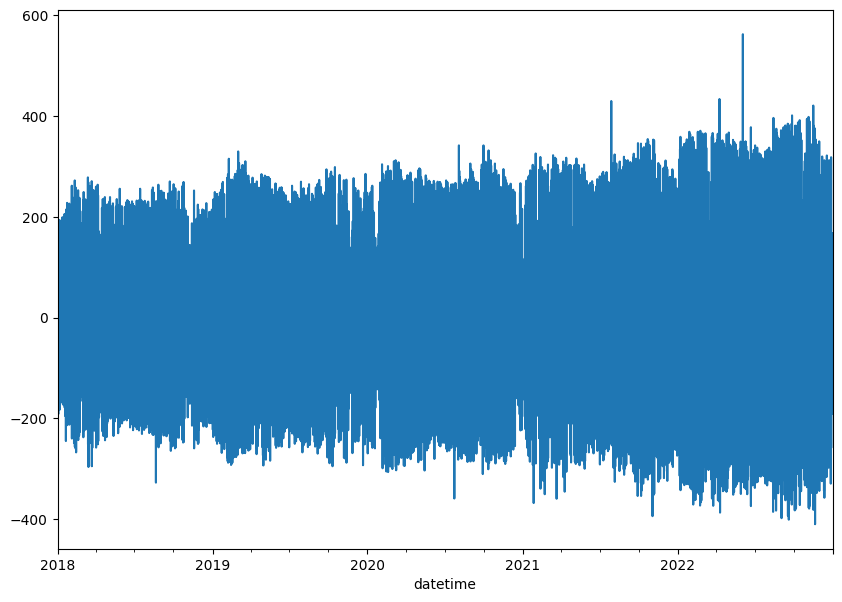

In [85]:
solar_diff = bretagne['solar'].diff()
solar_diff.plot()

<Axes: xlabel='datetime'>

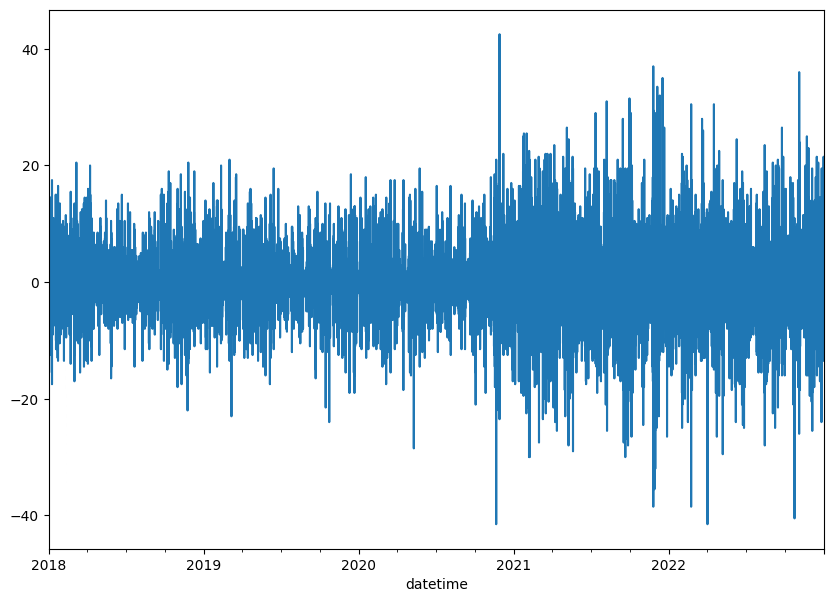

In [84]:

wind_diff = bretagne['wind'].diff()
wind_diff.plot()

C:\Users\melan\AppData\Local\Temp\ipykernel_22896\671180554.py:20: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


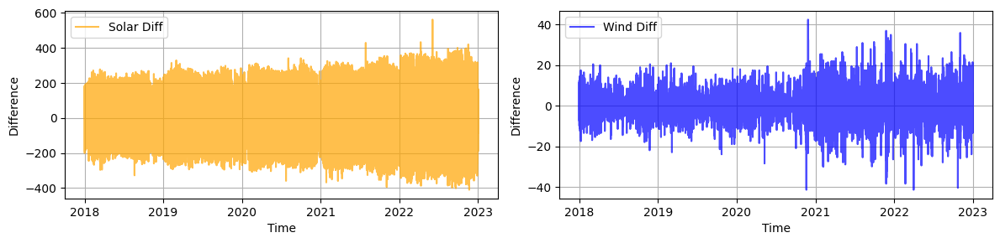

In [97]:
fig, ax = plt.subplots(1, 2, figsize=(12,3))

# Plot solar_diff
ax[0].plot(solar_diff, label='Solar Diff', color='orange', alpha=0.7)
ax[0].set_ylabel('Difference')
ax[0].set_xlabel('Time', fontsize=10)
# Plot wind_diff
ax[1].plot(wind_diff, label='Wind Diff', color='blue', alpha=0.7)
ax[1].set_ylabel('Difference')
ax[1].set_xlabel('Time', fontsize=10)

# Add labels, legend, and title

ax[0].legend()
ax[1].legend()
ax[0].grid(True)
ax[1].grid(True)

fig.tight_layout()
fig.show()
fig.savefig(f"figures/diff.png")

C:\Users\melan\AppData\Local\Temp\ipykernel_16428\2559241135.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  region_data['diff'] = region_data['solar'].diff()
C:\Users\melan\AppData\Local\Temp\ipykernel_16428\2559241135.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  region_data['diff'] = region_data['solar'].diff()
C:\Users\melan\AppData\Local\Temp\ipykernel_16428\2559241135.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index

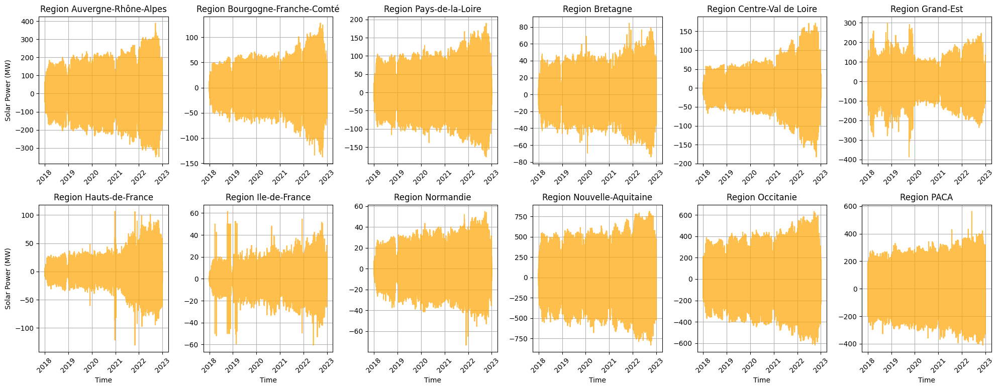

In [11]:
solar_ts = df_both[['solar', 'region']]
regions = solar_ts['region'].unique()
# Create a 2x6 grid of subplots
fig, axes = plt.subplots(2, 6, figsize=(20, 8), sharex=False, sharey=False)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each region and plot its time series
for i, region in enumerate(regions):
    # Filter data for the current region
    region_data = solar_ts[solar_ts['region'] == region]
    region_data['diff'] = region_data['solar'].diff()
    
    # Plot the time series
    axes[i].plot(region_data.index, region_data['diff'], label=f'Region {region}', color='orange', alpha=0.7)
    axes[i].set_title(f'Region {region}')
    axes[i].tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability
    axes[i].grid(True)
    
    # Add labels only to the leftmost and bottom plots
    if i % 6 == 0:  # Leftmost plots
        axes[i].set_ylabel('Solar Power (MW)')
    if i >= 6:  # Bottom plots
        axes[i].set_xlabel('Time')

# Hide unused subplots if regions < 12
for j in range(len(regions), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.suptitle('')
plt.tight_layout()
plt.show()
fig.savefig('figures/diff_all.png', dpi=300, bbox_inches='tight')

C:\Users\melan\AppData\Local\Temp\ipykernel_16428\1405655130.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  region_data['diff'] = region_data['wind'].diff()
C:\Users\melan\AppData\Local\Temp\ipykernel_16428\1405655130.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  region_data['diff'] = region_data['wind'].diff()
C:\Users\melan\AppData\Local\Temp\ipykernel_16428\1405655130.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer

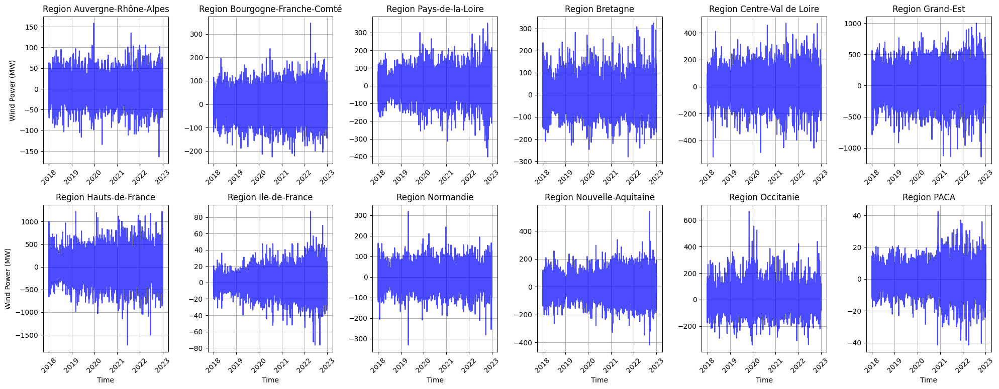

In [13]:
wind_ts = df_both[['wind', 'region']]

regions = wind_ts['region'].unique()
# Create a 2x6 grid of subplots
fig, axes = plt.subplots(2, 6, figsize=(20, 8), sharex=False, sharey=False)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each region and plot its time series
for i, region in enumerate(regions):
    # Filter data for the current region
    region_data = wind_ts[wind_ts['region'] == region]
    region_data['diff'] = region_data['wind'].diff()
    
    # Plot the time series
    axes[i].plot(region_data.index, region_data['diff'], label=f'Region {region}', color='blue', alpha=0.7)
    axes[i].set_title(f'Region {region}')
    axes[i].tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability
    axes[i].grid(True)
    
    # Add labels only to the leftmost and bottom plots
    if i % 6 == 0:  # Leftmost plots
        axes[i].set_ylabel('Wind Power (MW)')
    if i >= 6:  # Bottom plots
        axes[i].set_xlabel('Time')

# Hide unused subplots if regions < 12
for j in range(len(regions), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
fig.suptitle('')
plt.tight_layout()
plt.show()
fig.savefig('figures/wind_diff_all.png', dpi=300, bbox_inches='tight')